# USING STATISTICAL METHODS TO ANALYZE ATTACKS ON WIRELESS SENSOR NETWORKS
It is important to understand when the sensor readings have become different from those that it gave before, since a sensor failure can lead to losses. We present statistical methods for analyzing attacks on wireless sensor networks and their software implementation in the Python programming language, using the libraries scipy, seaborn, matplotlib, pandas and numpy. The developed program is being tested on real data.

## Import libraries (required by task)

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import ks_2samp, anderson_ksamp, cramervonmises_2samp

# auxiliary libraries
from IPython.display import display
import warnings; warnings.filterwarnings("ignore")
from datetime import datetime

## Functions

In [ ]:
def sub_one(x):
    res = np.array([])
    for i in range(1, len(x)):
        res = np.append(res, [x[i-1] - x[i]])
    return res.tolist()

In [ ]:
def test_signals(x, y, p_values=[0.05, 0.01, 0.001], dev_interval=None|list):
    """
    x, y - arrays
    dev_interval - интервал для выбросов, если они считаются нормой
    ks_test

        statistic
            float
            KS test statistic.

        pvalue
            float
            One-tailed or two-tailed p-value.

        statistic_location
            float
            Value from data1 or data2 corresponding with the KS statistic;
            i.e., the distance between the empirical distribution functions
            is measured at this observation.

        statistic_sign
            int
            +1 if the empirical distribution function of data1 exceeds the empirical
            distribution function of data2 at statistic_location, otherwise -1.

    anderson_ksamp (p-value - from table)

        statistic
            float
            Normalized k-sample Anderson-Darling test statistic.

        critical_values
            array
            The critical values for significance levels 25%, 10%, 5%, 2.5%, 1%,
             0.5%, 0.1%.

        pvalue
            float
            The approximate p-value of the test. If method is not provided,
            the value is floored / capped at 0.1% / 25%.

    cramervonmises_2samp

    statistic
        float
        Cramér-von Mises statistic.

    pvalue
        float
        The p-value.
    """
    ks_res = ks_2samp(x, y)
    anderson_res = anderson_ksamp([x, y])
    cramervonmises_res = cramervonmises_2samp(x, y)
    # 'status': ['warning', 'trouble', 'ok']
    dict_res = {'alpha': [0.05, 0.01, 0.001],
                'ks_test': [ks_res.pvalue for _ in range(3)],
                'anderson_test': anderson_res.critical_values[2:7:2].tolist(),
                'cramervonmises_test': [cramervonmises_res.pvalue for _ in range(3)],
                'outliers_sig1': [x[(x > x.mean() + 3 * x.std()) | (x < x.mean() - 3 * x.std())] for _ in range(3)],
                'outliers_sig2': [x[(x > x.mean() + 3 * x.std()) | (x < x.mean() - 3 * x.std())] for _ in range(3)]
                }

    dict_res['status'] = get_status(p_values, zip(dict_res['ks_test'],
                                                  dict_res['anderson_test'],
                                                  dict_res['cramervonmises_test']
                                                  ))
    if dev_interval == None:
        if dict_res['outliers_sig1'][0] != dict_res['outliers_sig2'][0]:
            for i in range(3):
                dict_res['status'][i] = 'trouble'
    elif isinstance(dev_interval, list) and len(dev_interval) == 2:
        for i in range(len(dict_res['outliers_sig2'][0])):
            if (dev_interval[0] >= dict_res['outliers_sig2'][0][i]) \
                or (dev_interval[1] <=  dict_res['outliers_sig2'][0][i]):
                for j in range(3):
                    dict_res['status'][j] = 'trouble'
                    return pd.DataFrame(dict_res)
    return pd.DataFrame(dict_res)

def get_status(p_values, tests_res):
    res = []
    st = ['warning', 'trouble', 'ok']
    for (a, (ks, anderson, cramer)) in zip(p_values, tests_res):
        summ = (ks < a) + (anderson < a) + (cramer < a)
        if summ == 3:
            res += ['trouble']
        elif summ == 0:
            res += ['ok']
        else:
            res += ['warning']
    return res

def attacked_status(x, y, a=0.05):
    test_res = test_signals(x, y)
    return test_res[test_res.alpha == a].status

In [ ]:
def visual_test_signals(sig1, sig2):
    #  диаграмму рассеяния для визуального теста
    #  соответствия двух законов и диаграмму “ящик с усами”
    #  для определения выбросов в данных
    plt.scatter(range(len(sig1)), sig1, color='g', label='signal 1', alpha=0.5)
    plt.scatter(range(len(sig2)), sig2, color='r', label='signal 2', alpha=0.5)
    plt.title('Scatter plot')
    plt.legend()
    plt.show()

    sns.kdeplot(sig1, color='g')
    sns.kdeplot(sig2, color='r')
    plt.title(' KDE plot')

    fig, ax = plt.subplots(1, 2)
    sns.boxplot(sig1, color='g', ax=ax[0])
    sns.boxplot(sig2, color='r', ax=ax[1])
    fig.suptitle('Box plot')
    plt.legend()
    plt.show()

## Loading data. EDA.

In [ ]:
filename = '/content/sensor-fault-detection.csv'

In [ ]:
names=['date', 'time', 'temperature', 'humidity']

In [ ]:
df = pd.read_csv(filename, sep=';')
df.head()

,Timestamp,SensorId,Value
0,2017-03-01T23:20:00+03:00,1,18.479807
1,2017-03-02T04:00:00+03:00,1,19.539112
2,2017-03-23T06:25:00+03:00,1,19.250198
3,2017-03-23T19:35:00+03:00,1,18.961285
4,2017-04-04T15:10:00+03:00,1,25.321623


In [ ]:
df.Timestamp = df.Timestamp.str.replace('T', ' ').str.extract('(.{19})')
df.Timestamp = pd.to_datetime(df.Timestamp, format='%Y-%m-%d %H:%M:%S')
df = df.sort_values(by=['Timestamp']).reset_index()

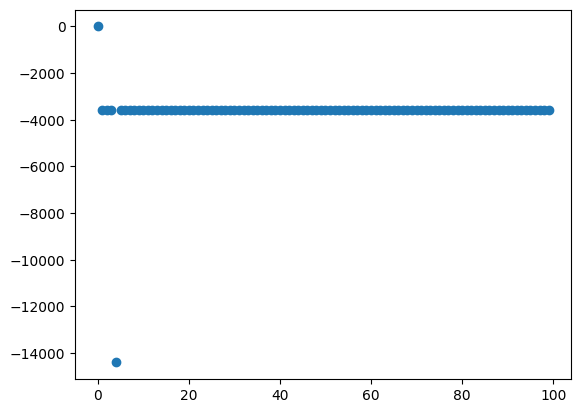

In [ ]:
res = sub_one(df.Timestamp)
s_res = [res[i].total_seconds() for i in range(len(res))]
s_res = [0] + s_res
s_res = np.array(s_res)
plt.scatter(range(len(res[:100])), s_res[:100])

In [ ]:
df.Timestamp[s_res < -4000]

,Timestamp
4,2016-08-01 08:00:00
313,2016-08-14 09:00:00
675,2016-08-29 12:00:00
775,2016-09-05 12:00:00
857,2016-09-09 14:00:00
...,...
47267,2017-07-08 22:15:00
47268,2017-07-09 00:15:00
50245,2017-07-19 14:05:00
52398,2017-07-27 08:05:00


In [ ]:
df.Timestamp.iloc[311:316]

,Timestamp
311,2016-08-14 03:00:00
312,2016-08-14 04:00:00
313,2016-08-14 09:00:00
314,2016-08-14 10:00:00
315,2016-08-14 11:00:00


In [ ]:
df.Timestamp.iloc[3:6]

,Timestamp
3,2016-08-01 04:00:00
4,2016-08-01 08:00:00
5,2016-08-01 09:00:00


Есть калибровочное время, с которого начинается отсчет

In [ ]:
idx = np.where(s_res < -4000)

In [ ]:
idx_reset = idx[0]-1

In [ ]:
df.Timestamp[idx[0]-1]

,Timestamp
3,2016-08-01 04:00:00
312,2016-08-14 04:00:00
674,2016-08-29 10:00:00
774,2016-09-02 15:00:00
856,2016-09-08 21:00:00
...,...
47266,2017-07-08 19:45:00
47267,2017-07-08 22:15:00
50244,2017-07-19 09:00:00
52397,2017-07-27 02:00:00


Перекалибровка происходит в разное время

In [ ]:
slices = [df.iloc[:idx_reset[0]]]
for i in range(len(idx_reset)-1):
    slices += [df.iloc[idx_reset[i]:idx_reset[i+1]]]

In [ ]:
time_idx = []
for i in range(len(df)-1):
    if (df.Timestamp.iloc[i+1].day - df.Timestamp.iloc[i].day) == 1:
        time_idx += [i+1]

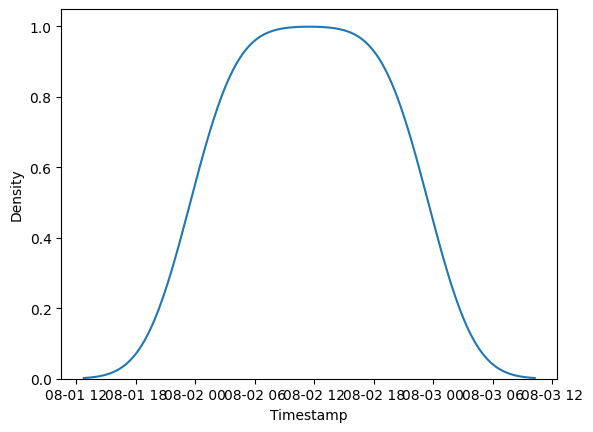

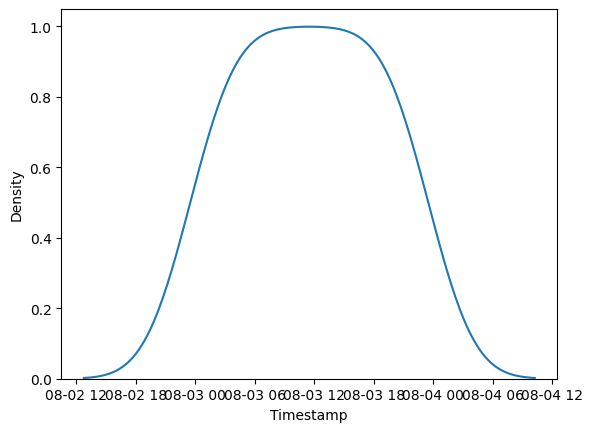

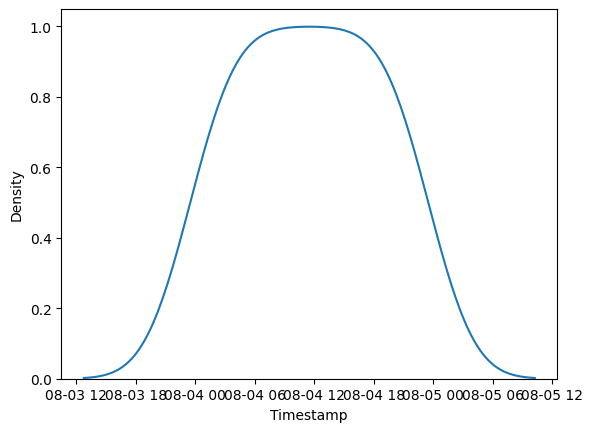

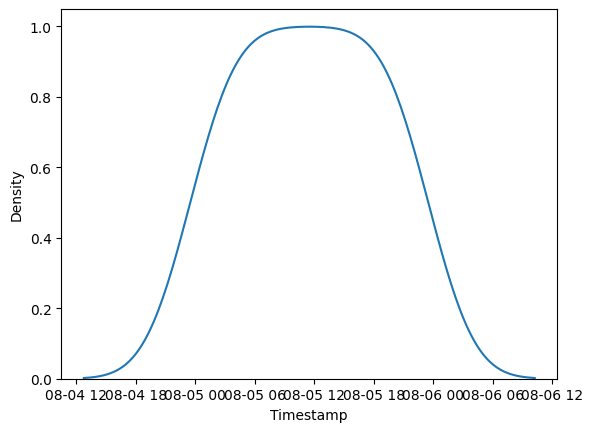

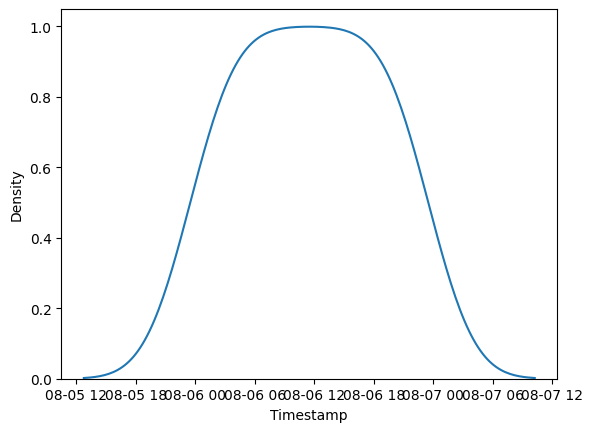

...

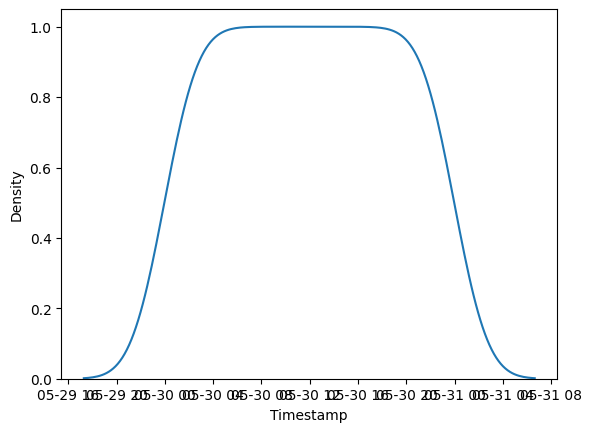

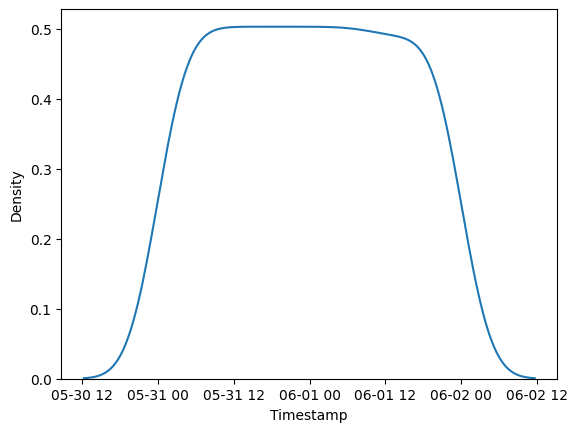

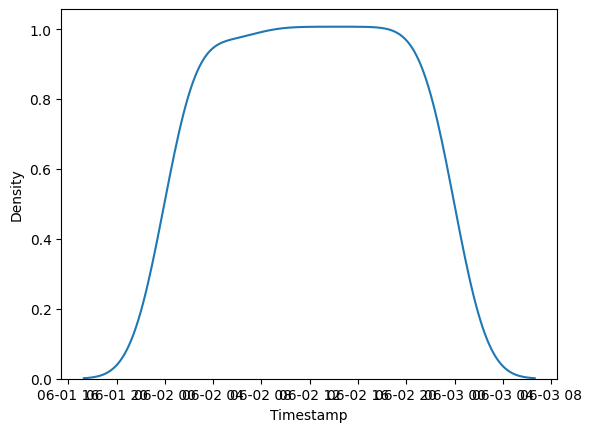

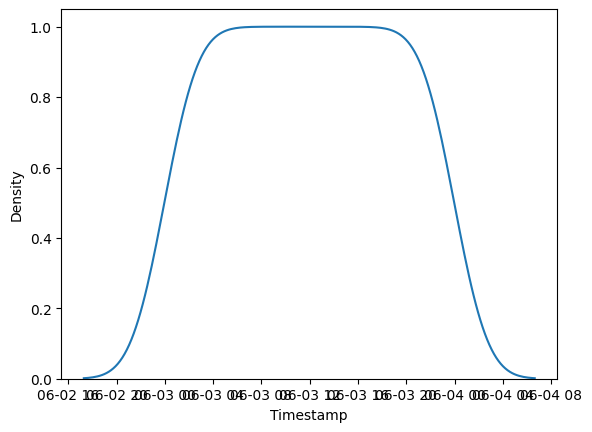

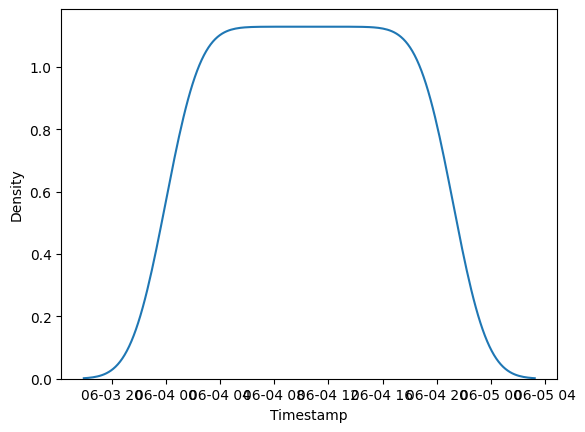

KeyboardInterrupt: 

In [ ]:
for i in range(len(time_idx)-1):
    sns.kdeplot(df.Timestamp.iloc[time_idx[i]:time_idx[i+1]])
    plt.show()

Абсолютно идеальные!

In [ ]:
slices += [df.iloc[idx_reset[-1]:]]

In [ ]:
lens = np.array([len(s) for s in slices])

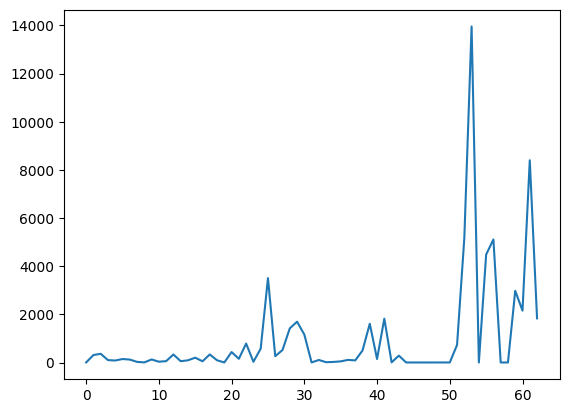

In [ ]:
plt.plot(range(len(slices)), lens)

In [ ]:
lens

array([    3,   309,   362,   100,    82,   144,   122,    26,     4,
         126,    33,    56,   333,    54,    91,   200,    50,   334,
          92,     2,   434,   155,   786,    30,   574,  3505,   262,
         519,  1417,  1695,  1161,     2,   105,    12,    24,    47,
         108,    87,   498,  1608,   144,  1821,     6,   286,     1,
           1,     1,     1,     1,     2,     1,   728,  5171, 13956,
           1,  4482,  5110,     1,     1,  2977,  2153,  8399,  1833])

## Compare signals

In [ ]:
sig1 = df.Value[time_idx[0]:time_idx[1]]
sig2 = df.Value[time_idx[1]:time_idx[2]]

In [ ]:
test_signals(sig1, sig2)

,alpha,ks_test,anderson_test,cramervonmises_test,outliers_sig1,outliers_sig2,status
0,0.050,0.449037,1.961,0.371411,"Series([], Name: Value, dtype: float64)","Series([], Name: Value, dtype: float64)",ok
1,0.010,0.449037,3.752,0.371411,"Series([], Name: Value, dtype: float64)","Series([], Name: Value, dtype: float64)",ok
2,0.001,0.449037,6.546,0.371411,"Series([], Name: Value, dtype: float64)","Series([], Name: Value, dtype: float64)",ok


ok


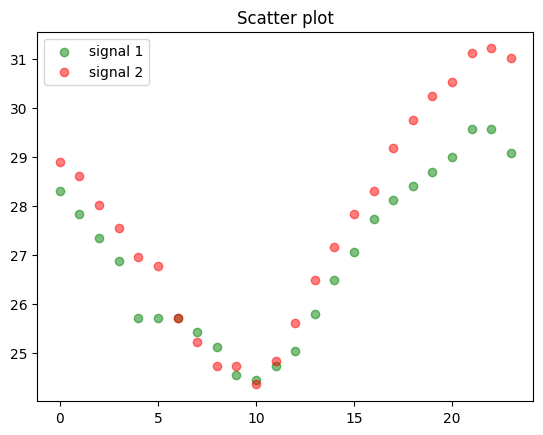

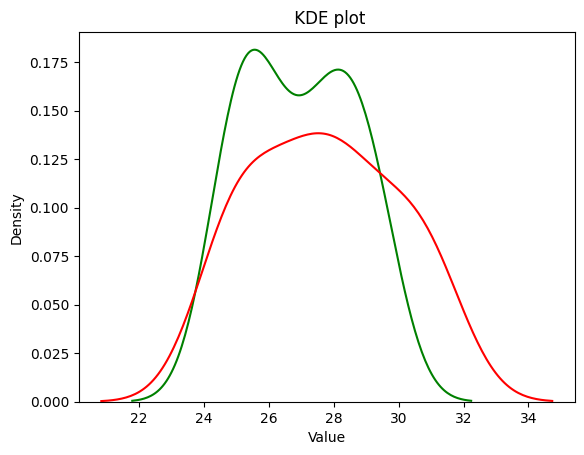

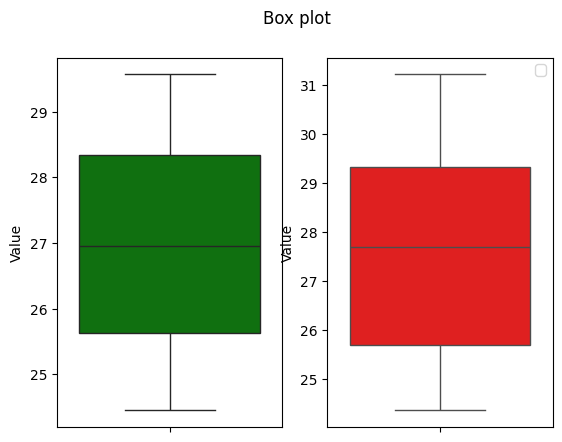

,alpha,ks_test,anderson_test,cramervonmises_test,outliers_sig1,outliers_sig2,status
0,0.050,1.0,1.961,1.0,"Series([], Name: Value, dtype: float64)","Series([], Name: Value, dtype: float64)",ok
1,0.010,1.0,3.752,1.0,"Series([], Name: Value, dtype: float64)","Series([], Name: Value, dtype: float64)",ok
2,0.001,1.0,6.546,1.0,"Series([], Name: Value, dtype: float64)","Series([], Name: Value, dtype: float64)",ok


In [ ]:
print(attacked_status(sig1, sig2).values[0])
visual_test_signals(sig1, sig2)
test_signals(sig1, sig2)


In [ ]:
df.describe()

,index,Timestamp,SensorId,Value
count,62629.000000,62629,62629.0,62629.000000
mean,31314.000000,2017-04-28 09:25:14.911622400,1.0,24.203861
min,0.000000,2016-08-01 01:00:00,1.0,6.886155
25%,15657.000000,2017-02-22 09:45:00,1.0,21.369419
50%,31314.000000,2017-05-13 15:10:00,1.0,24.550188
75%,46971.000000,2017-07-07 13:40:00,1.0,27.443794
max,62628.000000,2017-09-01 00:55:00,1.0,149.601822
std,18079.579342,NaN,0.0,5.411599


In [ ]:
df.Timestamp.dt.hour.value_counts()

,count
Timestamp,
17,2659
18,2650
16,2640
19,2622
1,2617
20,2616
3,2615
5,2615
21,2615


warning


,alpha,ks_test,anderson_test,cramervonmises_test,outliers_sig1,outliers_sig2,status
0,0.050,0.000041,1.961,0.000061,2940 -3.458719 2941 -4.103591 2942 -4.87...,2940 -3.458719 2941 -4.103591 2942 -4.87...,warning
1,0.010,0.000041,3.752,0.000061,2940 -3.458719 2941 -4.103591 2942 -4.87...,2940 -3.458719 2941 -4.103591 2942 -4.87...,warning
2,0.001,0.000041,6.546,0.000061,2940 -3.458719 2941 -4.103591 2942 -4.87...,2940 -3.458719 2941 -4.103591 2942 -4.87...,warning


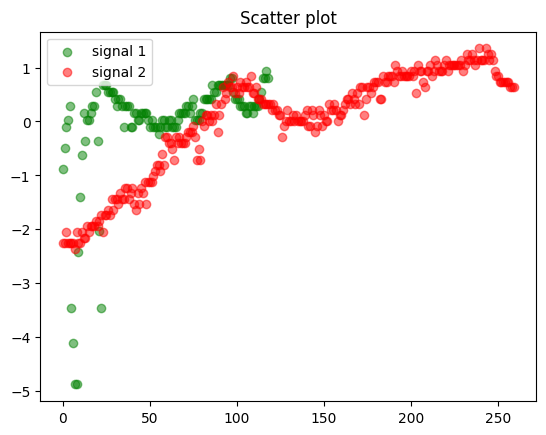

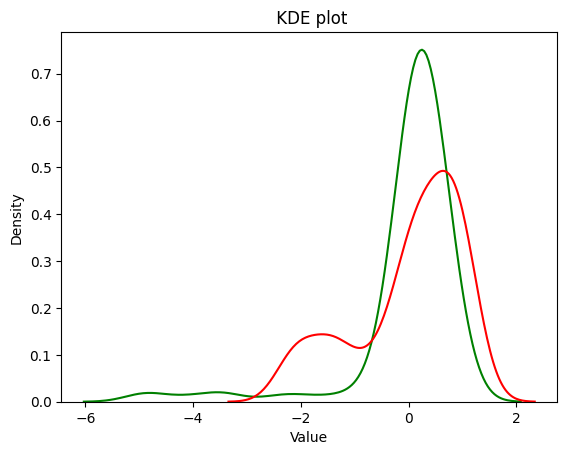

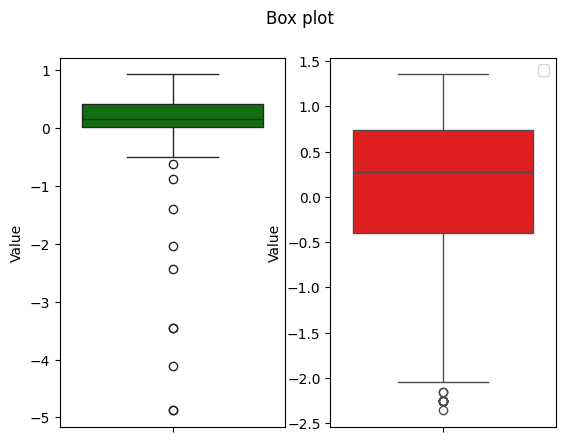

warning


,alpha,ks_test,anderson_test,cramervonmises_test,outliers_sig1,outliers_sig2,status
0,0.050,3.003949e-07,1.961,7.826241e-07,"Series([], Name: Value, dtype: float64)","Series([], Name: Value, dtype: float64)",warning
1,0.010,3.003949e-07,3.752,7.826241e-07,"Series([], Name: Value, dtype: float64)","Series([], Name: Value, dtype: float64)",warning
2,0.001,3.003949e-07,6.546,7.826241e-07,"Series([], Name: Value, dtype: float64)","Series([], Name: Value, dtype: float64)",warning


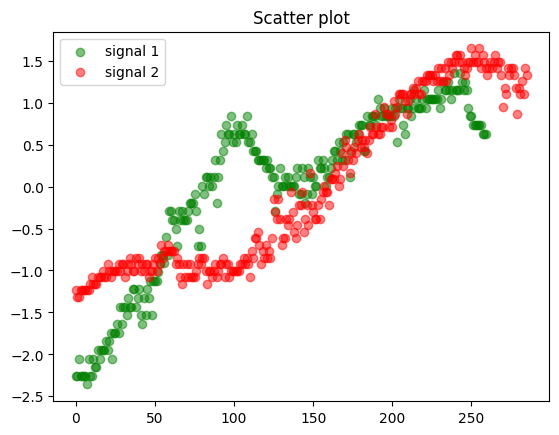

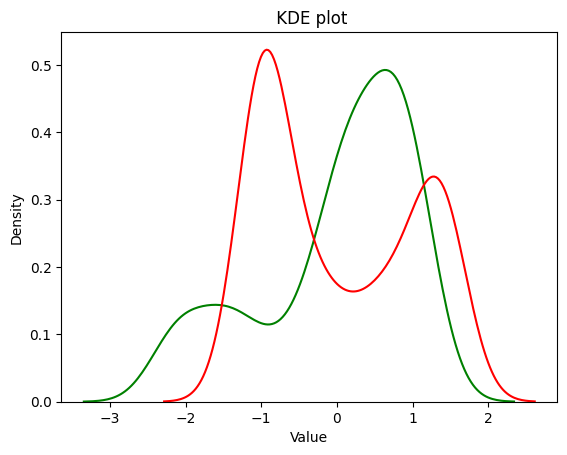

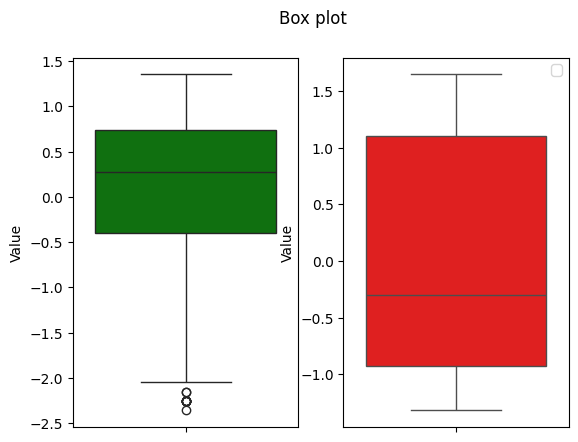

warning


,alpha,ks_test,anderson_test,cramervonmises_test,outliers_sig1,outliers_sig2,status
0,0.050,0.000006,1.961,0.000667,"Series([], Name: Value, dtype: float64)","Series([], Name: Value, dtype: float64)",warning
1,0.010,0.000006,3.752,0.000667,"Series([], Name: Value, dtype: float64)","Series([], Name: Value, dtype: float64)",warning
2,0.001,0.000006,6.546,0.000667,"Series([], Name: Value, dtype: float64)","Series([], Name: Value, dtype: float64)",warning


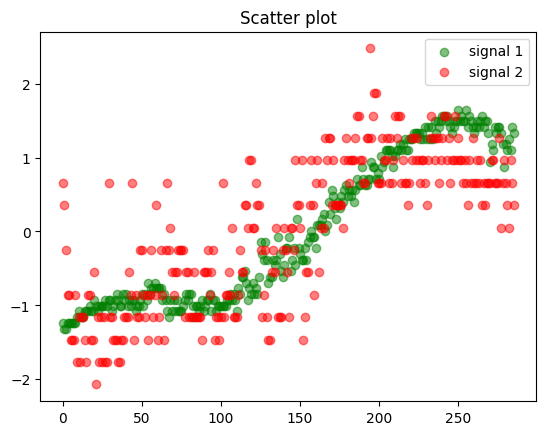

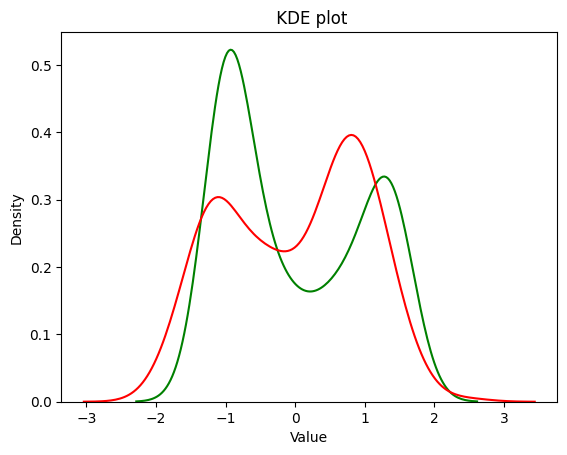

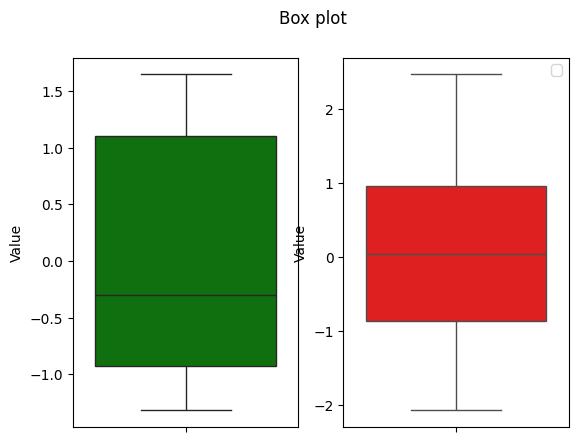

warning


,alpha,ks_test,anderson_test,cramervonmises_test,outliers_sig1,outliers_sig2,status
0,0.050,0.001695,1.961,0.005731,"Series([], Name: Value, dtype: float64)","Series([], Name: Value, dtype: float64)",warning
1,0.010,0.001695,3.752,0.005731,"Series([], Name: Value, dtype: float64)","Series([], Name: Value, dtype: float64)",warning
2,0.001,0.001695,6.546,0.005731,"Series([], Name: Value, dtype: float64)","Series([], Name: Value, dtype: float64)",ok


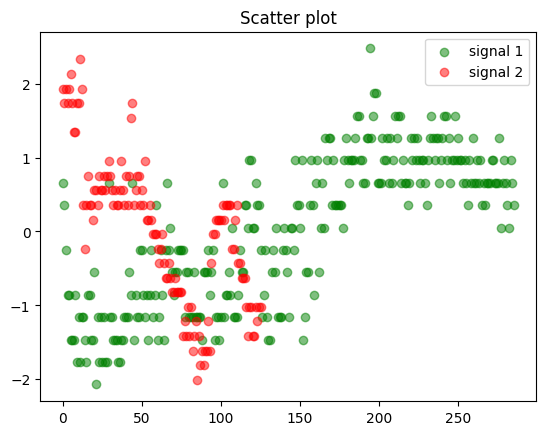

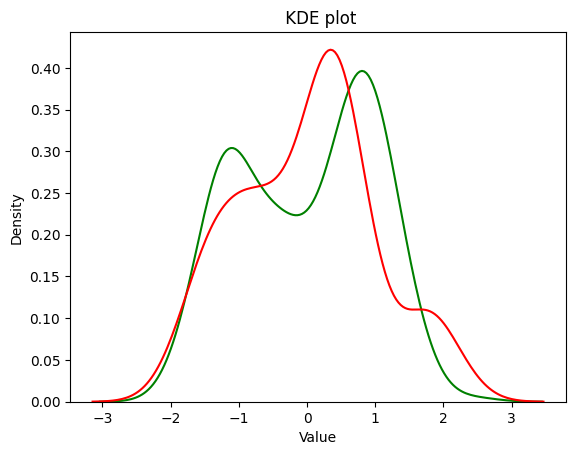

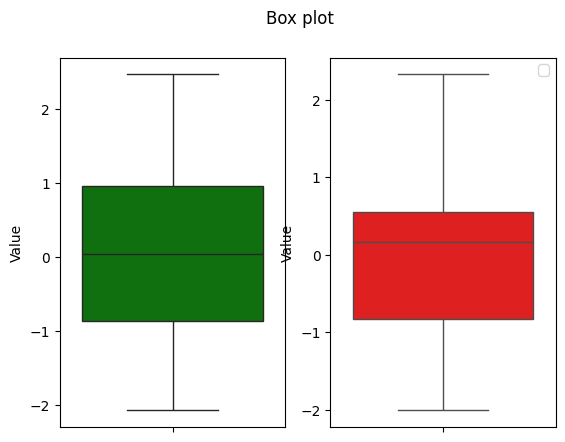

warning


,alpha,ks_test,anderson_test,cramervonmises_test,outliers_sig1,outliers_sig2,status
0,0.050,0.040808,1.961,0.029053,"Series([], Name: Value, dtype: float64)","Series([], Name: Value, dtype: float64)",warning
1,0.010,0.040808,3.752,0.029053,"Series([], Name: Value, dtype: float64)","Series([], Name: Value, dtype: float64)",ok
2,0.001,0.040808,6.546,0.029053,"Series([], Name: Value, dtype: float64)","Series([], Name: Value, dtype: float64)",ok


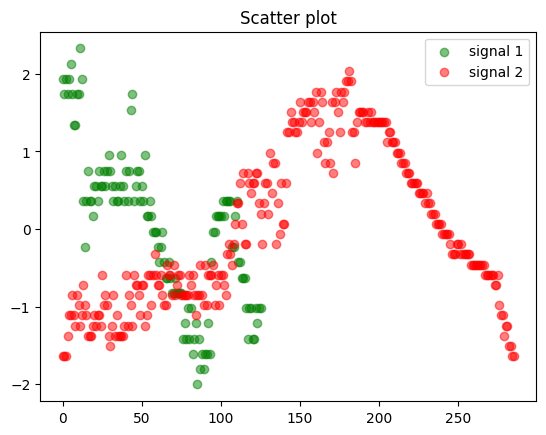

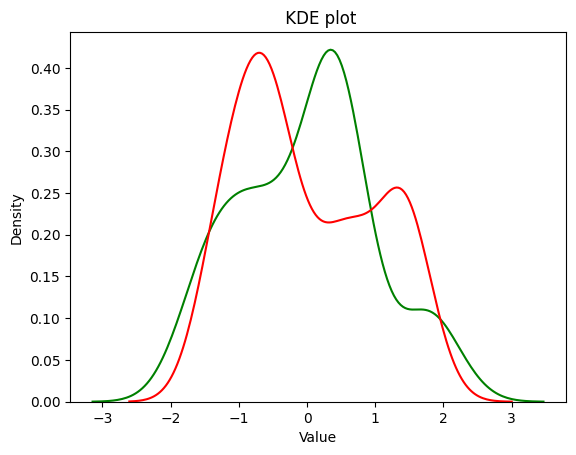

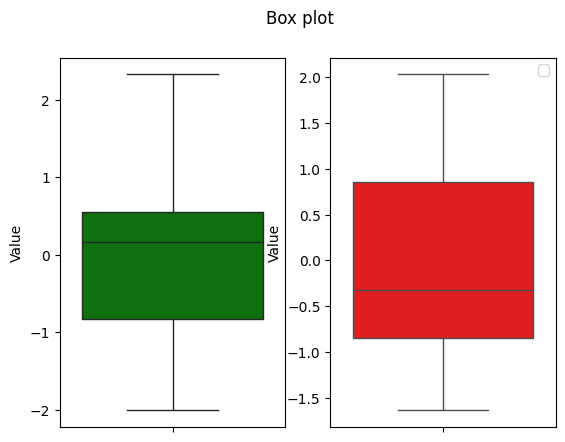

warning


,alpha,ks_test,anderson_test,cramervonmises_test,outliers_sig1,outliers_sig2,status
0,0.050,2.599688e-07,1.961,0.000093,"Series([], Name: Value, dtype: float64)","Series([], Name: Value, dtype: float64)",warning
1,0.010,2.599688e-07,3.752,0.000093,"Series([], Name: Value, dtype: float64)","Series([], Name: Value, dtype: float64)",warning
2,0.001,2.599688e-07,6.546,0.000093,"Series([], Name: Value, dtype: float64)","Series([], Name: Value, dtype: float64)",warning


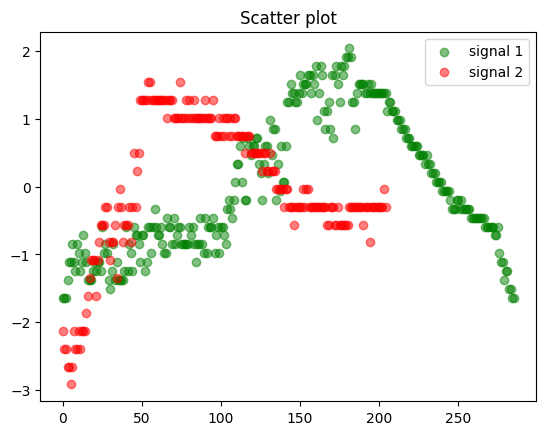

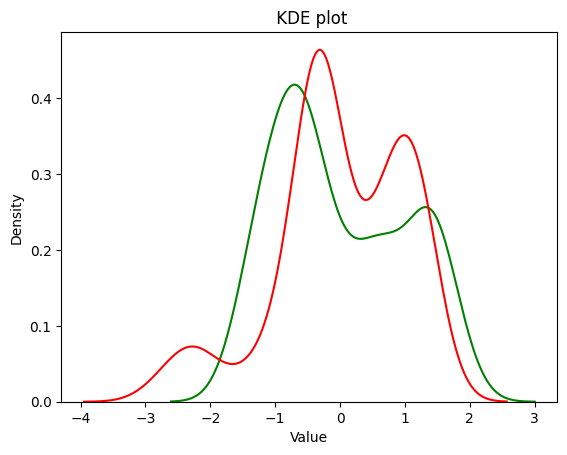

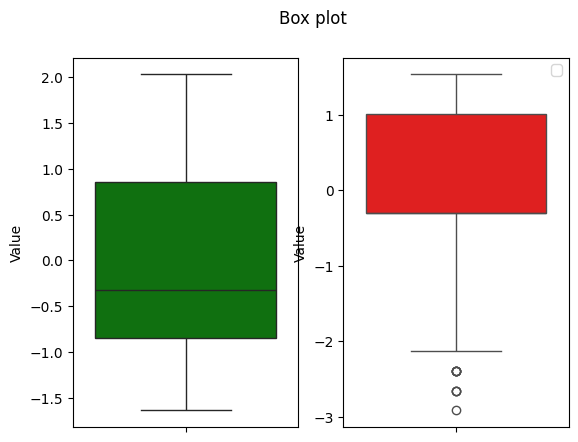

warning


,alpha,ks_test,anderson_test,cramervonmises_test,outliers_sig1,outliers_sig2,status
0,0.050,1.725422e-07,1.961,0.000077,"Series([], Name: Value, dtype: float64)","Series([], Name: Value, dtype: float64)",warning
1,0.010,1.725422e-07,3.752,0.000077,"Series([], Name: Value, dtype: float64)","Series([], Name: Value, dtype: float64)",warning
2,0.001,1.725422e-07,6.546,0.000077,"Series([], Name: Value, dtype: float64)","Series([], Name: Value, dtype: float64)",warning


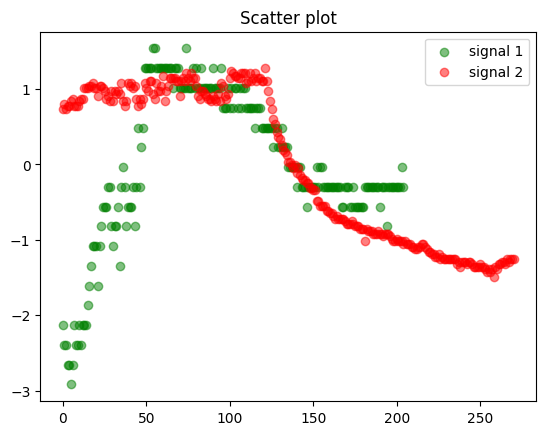

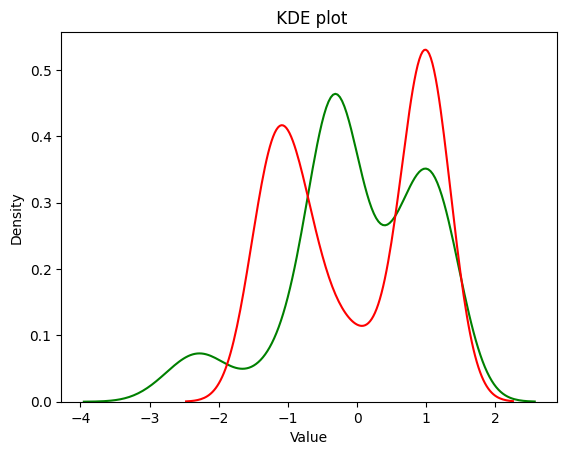

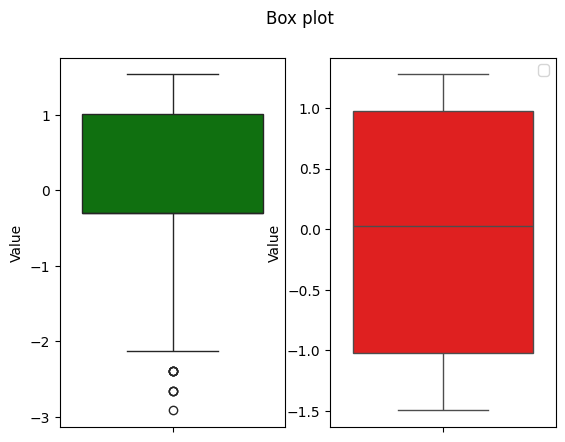

warning


,alpha,ks_test,anderson_test,cramervonmises_test,outliers_sig1,outliers_sig2,status
0,0.050,0.001924,1.961,0.010427,"Series([], Name: Value, dtype: float64)","Series([], Name: Value, dtype: float64)",warning
1,0.010,0.001924,3.752,0.010427,"Series([], Name: Value, dtype: float64)","Series([], Name: Value, dtype: float64)",warning
2,0.001,0.001924,6.546,0.010427,"Series([], Name: Value, dtype: float64)","Series([], Name: Value, dtype: float64)",ok


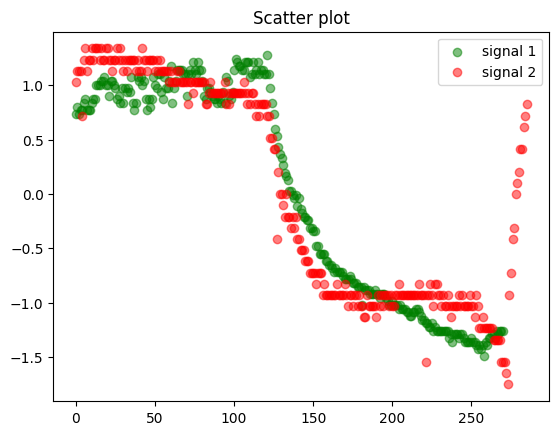

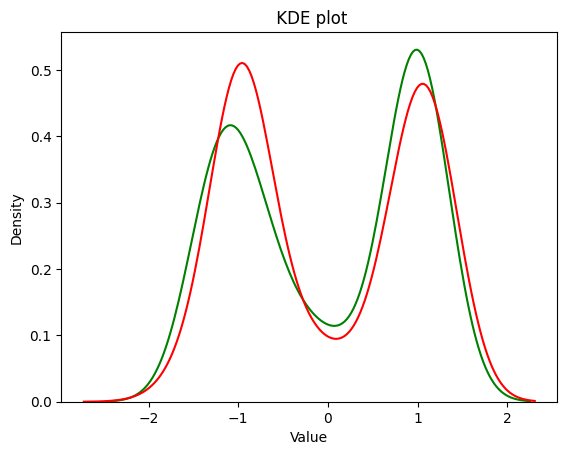

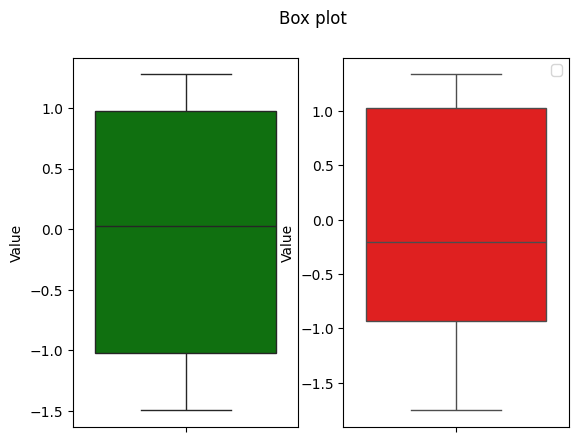

warning


,alpha,ks_test,anderson_test,cramervonmises_test,outliers_sig1,outliers_sig2,status
0,0.050,1.029389e-07,1.961,0.000007,"Series([], Name: Value, dtype: float64)","Series([], Name: Value, dtype: float64)",warning
1,0.010,1.029389e-07,3.752,0.000007,"Series([], Name: Value, dtype: float64)","Series([], Name: Value, dtype: float64)",warning
2,0.001,1.029389e-07,6.546,0.000007,"Series([], Name: Value, dtype: float64)","Series([], Name: Value, dtype: float64)",warning


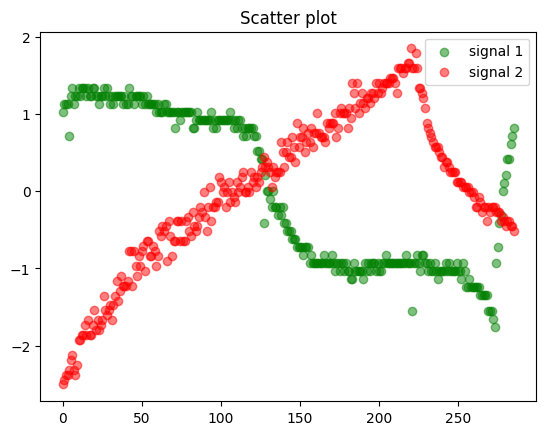

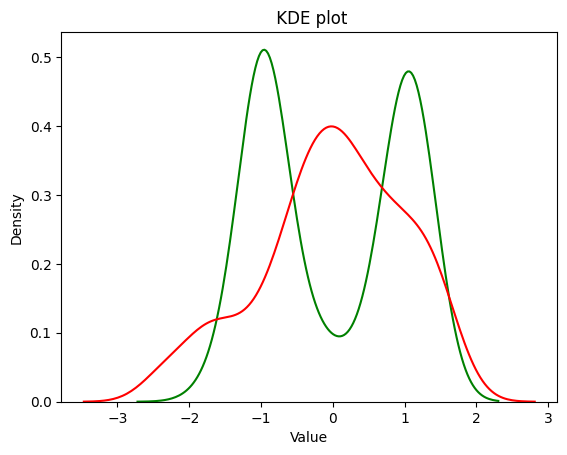

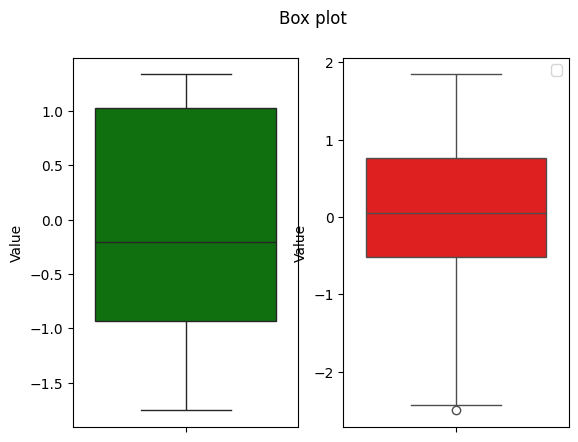

warning


,alpha,ks_test,anderson_test,cramervonmises_test,outliers_sig1,outliers_sig2,status
0,0.050,0.000002,1.961,0.000046,"Series([], Name: Value, dtype: float64)","Series([], Name: Value, dtype: float64)",warning
1,0.010,0.000002,3.752,0.000046,"Series([], Name: Value, dtype: float64)","Series([], Name: Value, dtype: float64)",warning
2,0.001,0.000002,6.546,0.000046,"Series([], Name: Value, dtype: float64)","Series([], Name: Value, dtype: float64)",warning


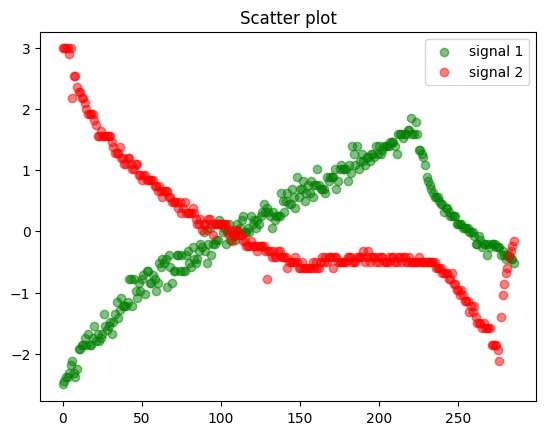

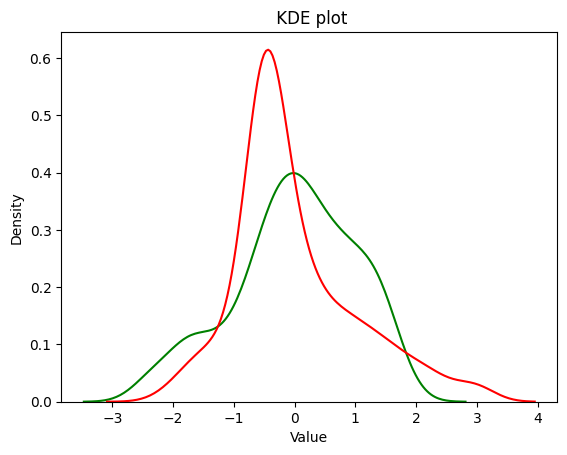

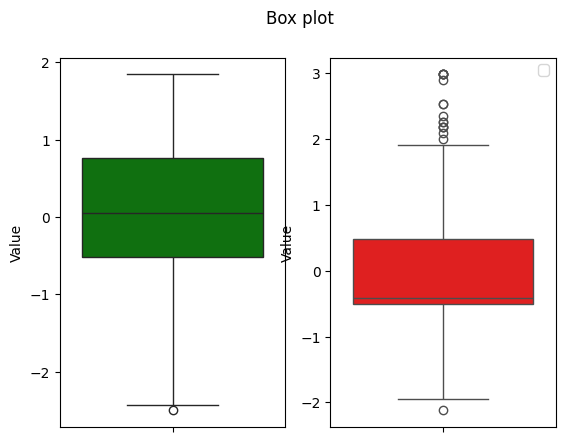

warning


,alpha,ks_test,anderson_test,cramervonmises_test,outliers_sig1,outliers_sig2,status
0,0.050,0.000104,1.961,0.013435,"Series([], Name: Value, dtype: float64)","Series([], Name: Value, dtype: float64)",warning
1,0.010,0.000104,3.752,0.013435,"Series([], Name: Value, dtype: float64)","Series([], Name: Value, dtype: float64)",warning
2,0.001,0.000104,6.546,0.013435,"Series([], Name: Value, dtype: float64)","Series([], Name: Value, dtype: float64)",warning


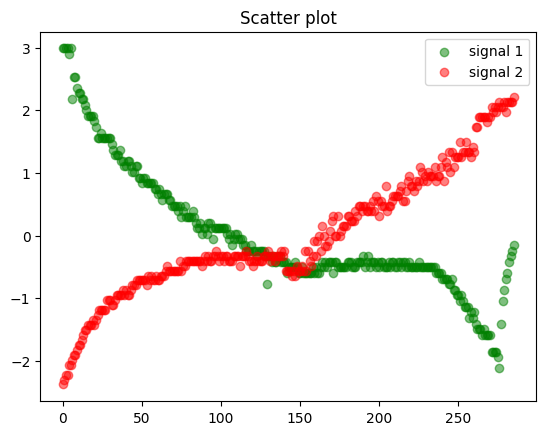

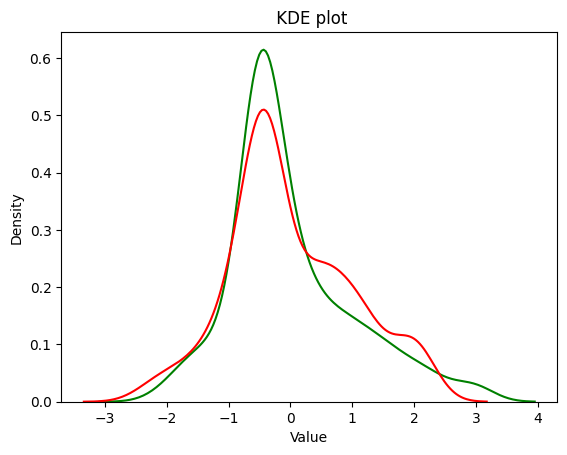

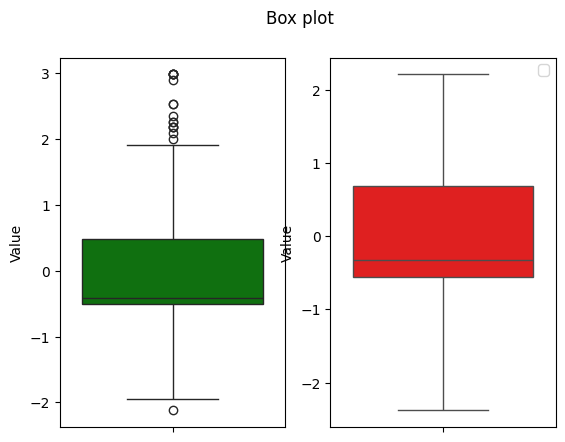

warning


,alpha,ks_test,anderson_test,cramervonmises_test,outliers_sig1,outliers_sig2,status
0,0.050,0.000378,1.961,0.001008,"Series([], Name: Value, dtype: float64)","Series([], Name: Value, dtype: float64)",warning
1,0.010,0.000378,3.752,0.001008,"Series([], Name: Value, dtype: float64)","Series([], Name: Value, dtype: float64)",warning
2,0.001,0.000378,6.546,0.001008,"Series([], Name: Value, dtype: float64)","Series([], Name: Value, dtype: float64)",warning


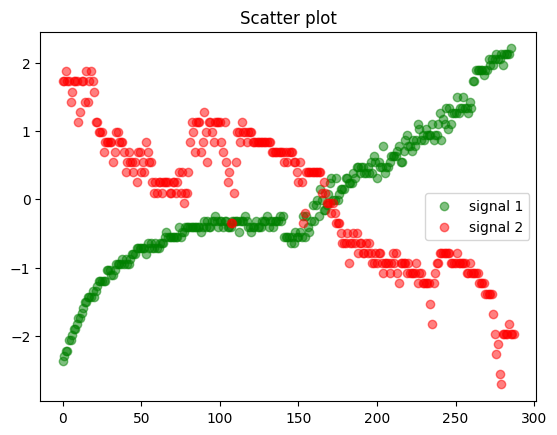

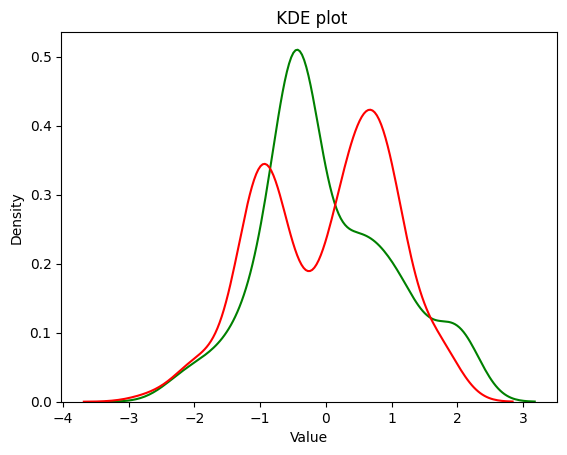

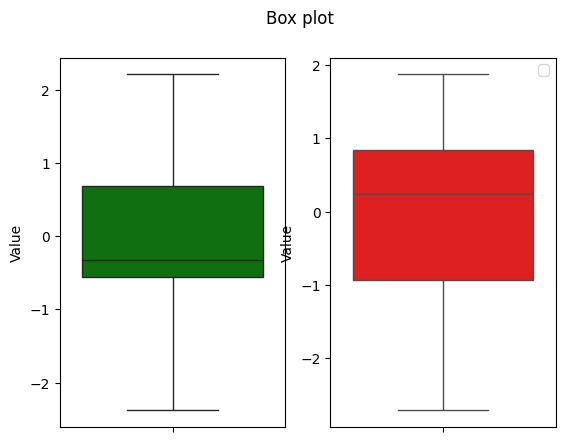

warning


,alpha,ks_test,anderson_test,cramervonmises_test,outliers_sig1,outliers_sig2,status
0,0.050,0.028341,1.961,0.04246,"Series([], Name: Value, dtype: float64)","Series([], Name: Value, dtype: float64)",warning
1,0.010,0.028341,3.752,0.04246,"Series([], Name: Value, dtype: float64)","Series([], Name: Value, dtype: float64)",ok
2,0.001,0.028341,6.546,0.04246,"Series([], Name: Value, dtype: float64)","Series([], Name: Value, dtype: float64)",ok


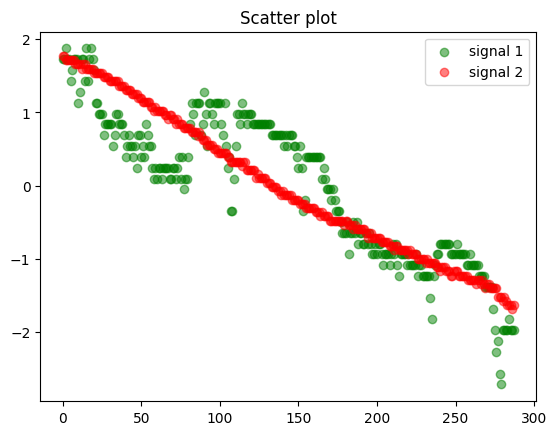

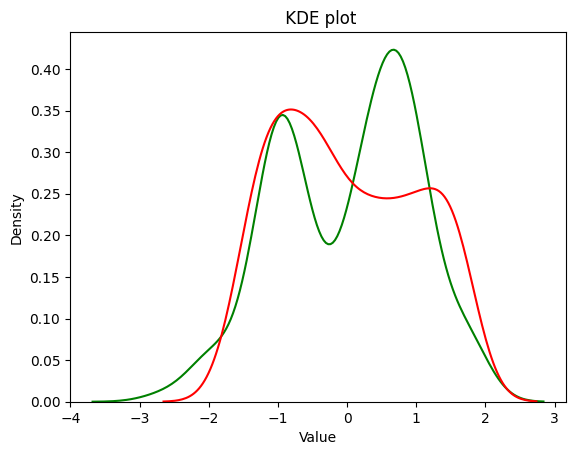

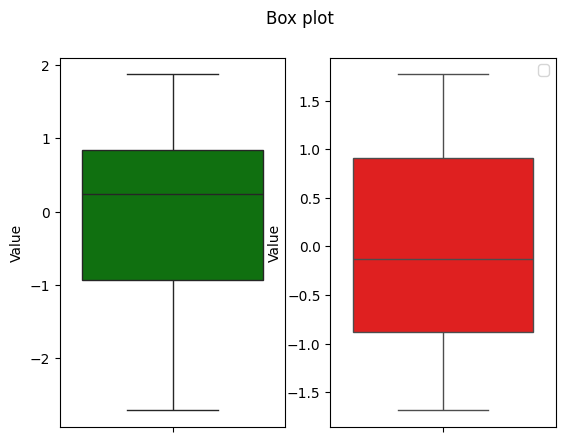

warning


,alpha,ks_test,anderson_test,cramervonmises_test,outliers_sig1,outliers_sig2,status
0,0.050,0.022131,1.961,0.011371,"Series([], Name: Value, dtype: float64)","Series([], Name: Value, dtype: float64)",warning
1,0.010,0.022131,3.752,0.011371,"Series([], Name: Value, dtype: float64)","Series([], Name: Value, dtype: float64)",ok
2,0.001,0.022131,6.546,0.011371,"Series([], Name: Value, dtype: float64)","Series([], Name: Value, dtype: float64)",ok


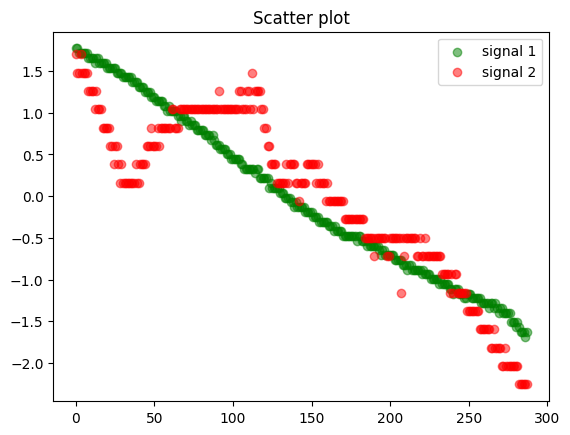

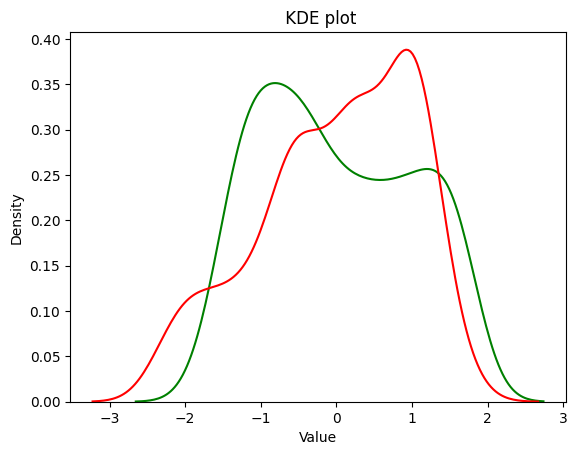

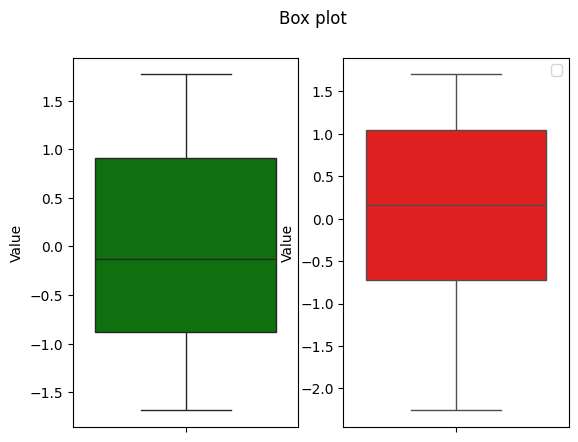

warning


,alpha,ks_test,anderson_test,cramervonmises_test,outliers_sig1,outliers_sig2,status
0,0.050,0.000025,1.961,0.002887,"Series([], Name: Value, dtype: float64)","Series([], Name: Value, dtype: float64)",warning
1,0.010,0.000025,3.752,0.002887,"Series([], Name: Value, dtype: float64)","Series([], Name: Value, dtype: float64)",warning
2,0.001,0.000025,6.546,0.002887,"Series([], Name: Value, dtype: float64)","Series([], Name: Value, dtype: float64)",warning


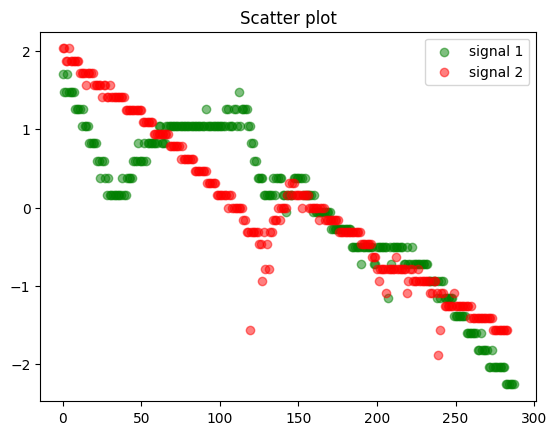

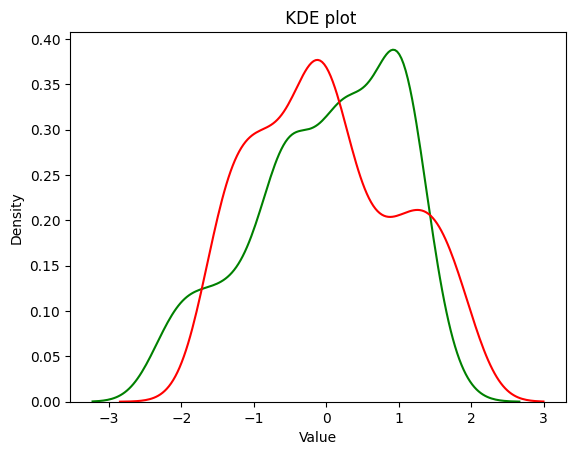

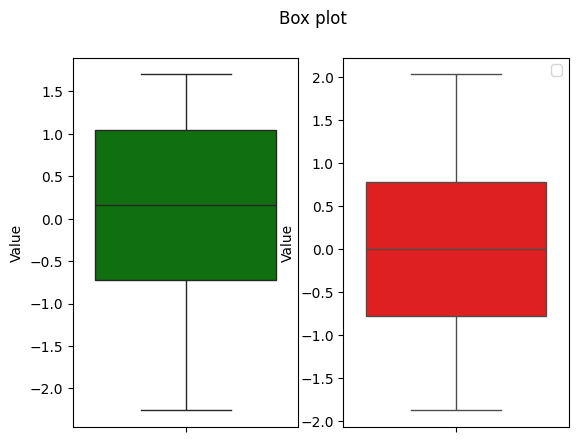

warning


,alpha,ks_test,anderson_test,cramervonmises_test,outliers_sig1,outliers_sig2,status
0,0.050,0.021846,1.961,0.045576,"Series([], Name: Value, dtype: float64)","Series([], Name: Value, dtype: float64)",warning
1,0.010,0.021846,3.752,0.045576,"Series([], Name: Value, dtype: float64)","Series([], Name: Value, dtype: float64)",ok
2,0.001,0.021846,6.546,0.045576,"Series([], Name: Value, dtype: float64)","Series([], Name: Value, dtype: float64)",ok


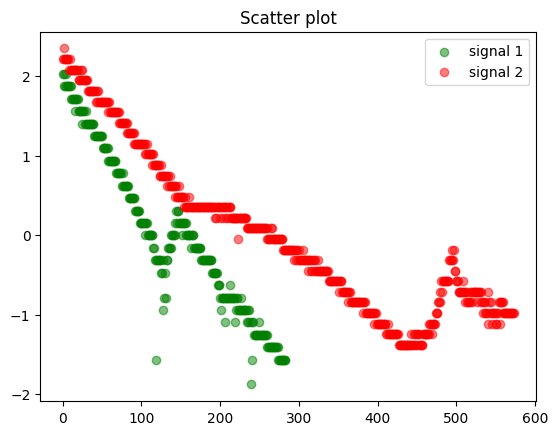

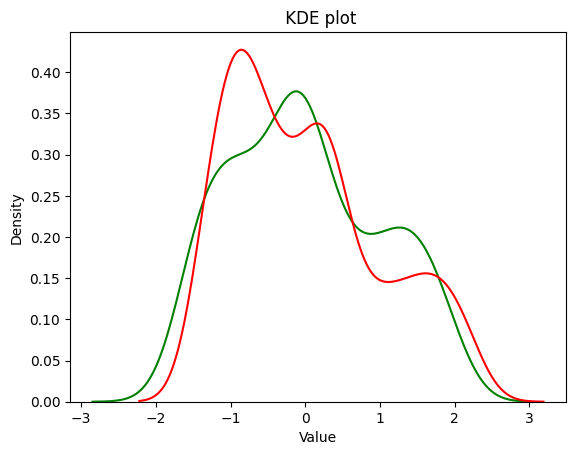

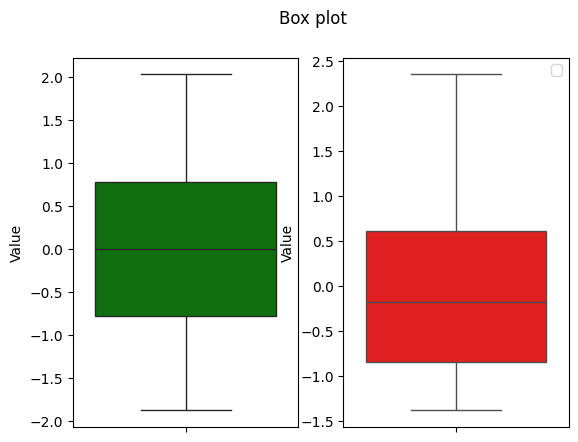

warning


,alpha,ks_test,anderson_test,cramervonmises_test,outliers_sig1,outliers_sig2,status
0,0.050,9.843471e-11,1.961,2.149395e-07,"Series([], Name: Value, dtype: float64)","Series([], Name: Value, dtype: float64)",warning
1,0.010,9.843471e-11,3.752,2.149395e-07,"Series([], Name: Value, dtype: float64)","Series([], Name: Value, dtype: float64)",warning
2,0.001,9.843471e-11,6.546,2.149395e-07,"Series([], Name: Value, dtype: float64)","Series([], Name: Value, dtype: float64)",warning


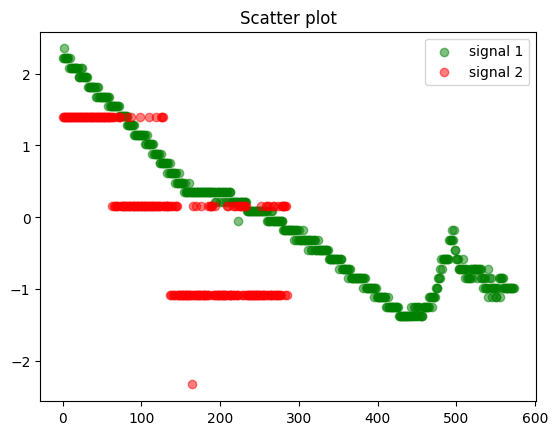

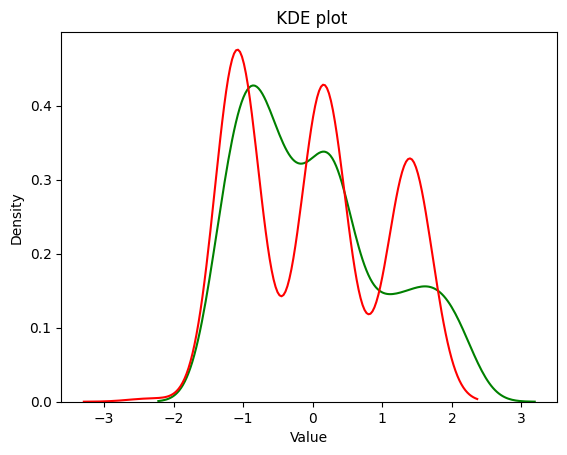

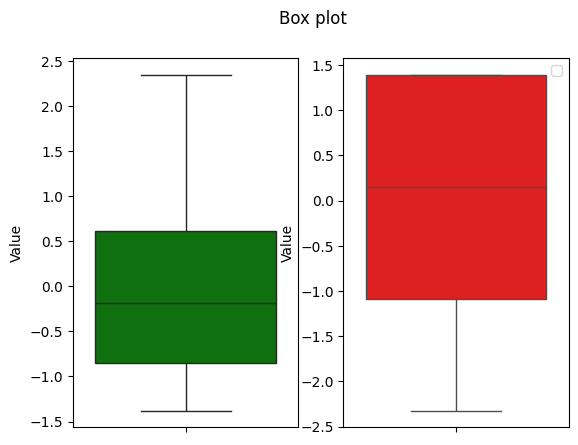

warning


,alpha,ks_test,anderson_test,cramervonmises_test,outliers_sig1,outliers_sig2,status
0,0.050,5.288104e-12,1.961,1.119198e-10,"Series([], Name: Value, dtype: float64)","Series([], Name: Value, dtype: float64)",warning
1,0.010,5.288104e-12,3.752,1.119198e-10,"Series([], Name: Value, dtype: float64)","Series([], Name: Value, dtype: float64)",warning
2,0.001,5.288104e-12,6.546,1.119198e-10,"Series([], Name: Value, dtype: float64)","Series([], Name: Value, dtype: float64)",warning


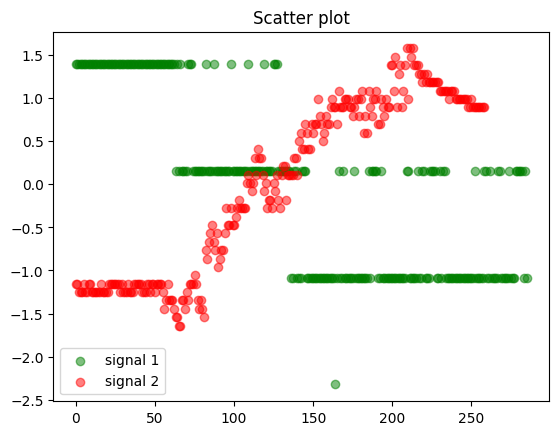

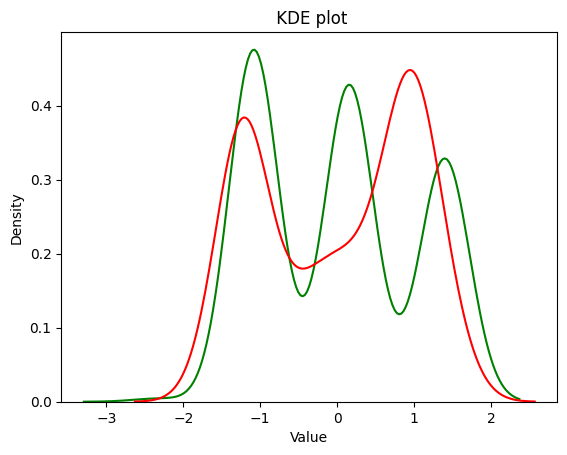

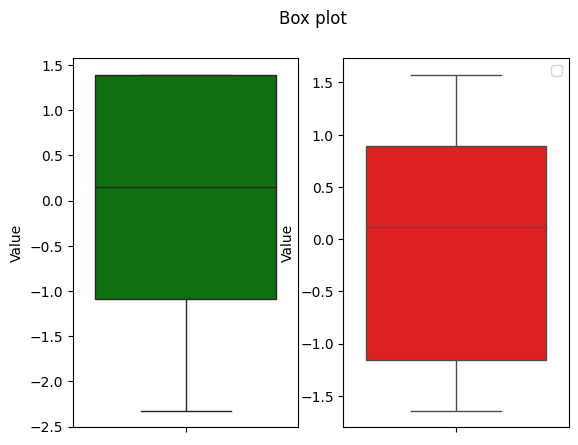

warning


,alpha,ks_test,anderson_test,cramervonmises_test,outliers_sig1,outliers_sig2,status
0,0.050,4.170500e-07,1.961,0.000482,"Series([], Name: Value, dtype: float64)","Series([], Name: Value, dtype: float64)",warning
1,0.010,4.170500e-07,3.752,0.000482,"Series([], Name: Value, dtype: float64)","Series([], Name: Value, dtype: float64)",warning
2,0.001,4.170500e-07,6.546,0.000482,"Series([], Name: Value, dtype: float64)","Series([], Name: Value, dtype: float64)",warning


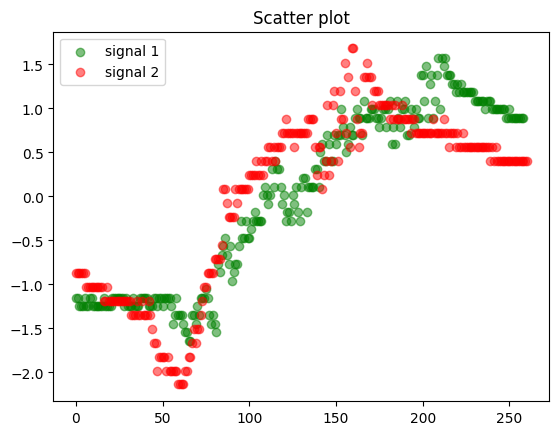

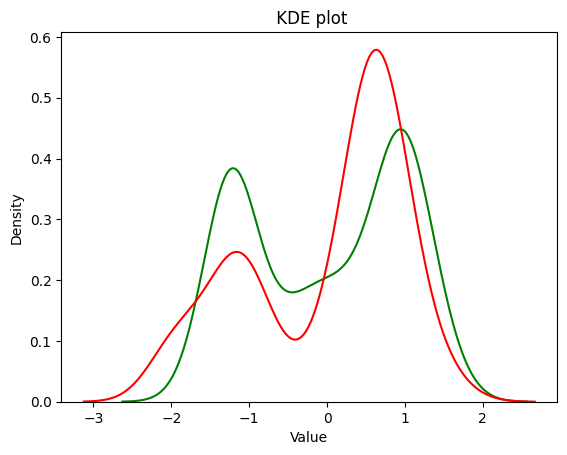

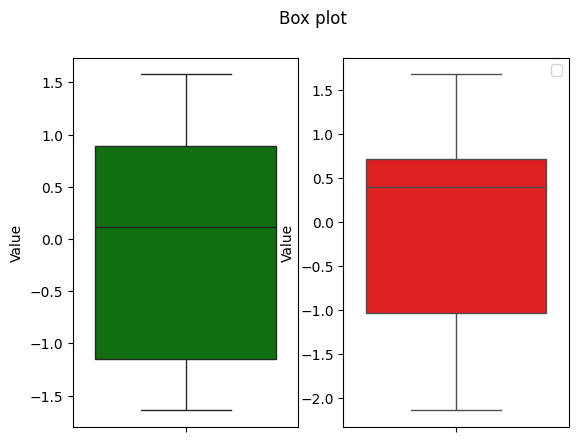

warning


,alpha,ks_test,anderson_test,cramervonmises_test,outliers_sig1,outliers_sig2,status
0,0.050,0.001299,1.961,0.003784,"Series([], Name: Value, dtype: float64)","Series([], Name: Value, dtype: float64)",warning
1,0.010,0.001299,3.752,0.003784,"Series([], Name: Value, dtype: float64)","Series([], Name: Value, dtype: float64)",warning
2,0.001,0.001299,6.546,0.003784,"Series([], Name: Value, dtype: float64)","Series([], Name: Value, dtype: float64)",ok


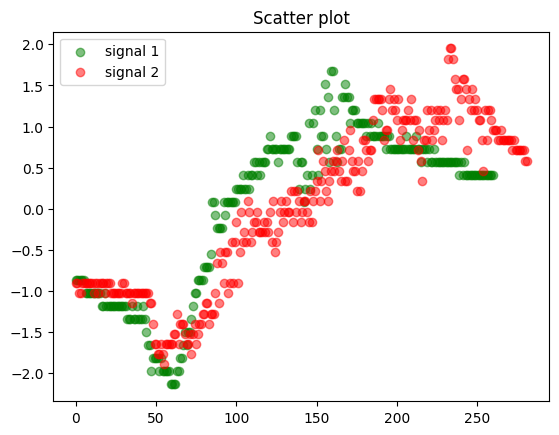

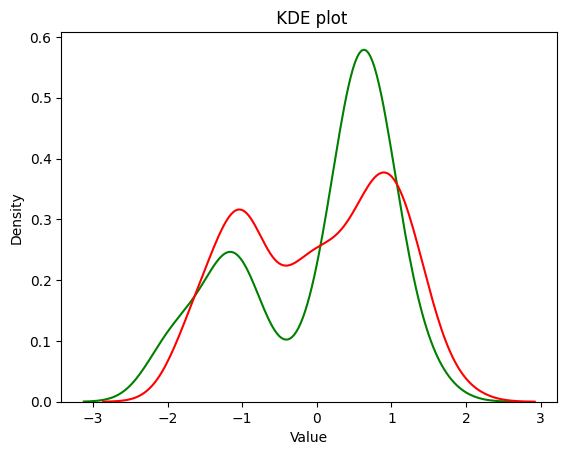

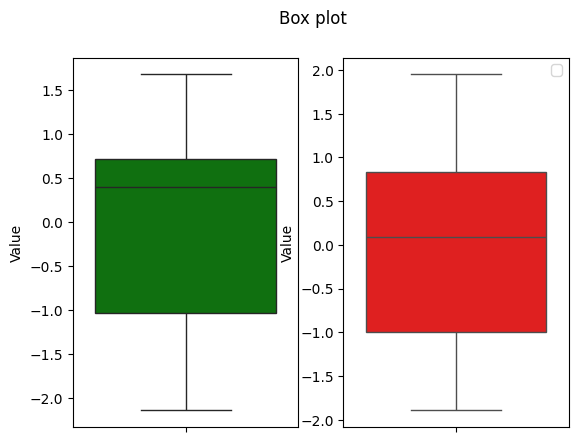

warning


,alpha,ks_test,anderson_test,cramervonmises_test,outliers_sig1,outliers_sig2,status
0,0.050,0.000119,1.961,0.008924,"Series([], Name: Value, dtype: float64)","Series([], Name: Value, dtype: float64)",warning
1,0.010,0.000119,3.752,0.008924,"Series([], Name: Value, dtype: float64)","Series([], Name: Value, dtype: float64)",warning
2,0.001,0.000119,6.546,0.008924,"Series([], Name: Value, dtype: float64)","Series([], Name: Value, dtype: float64)",warning


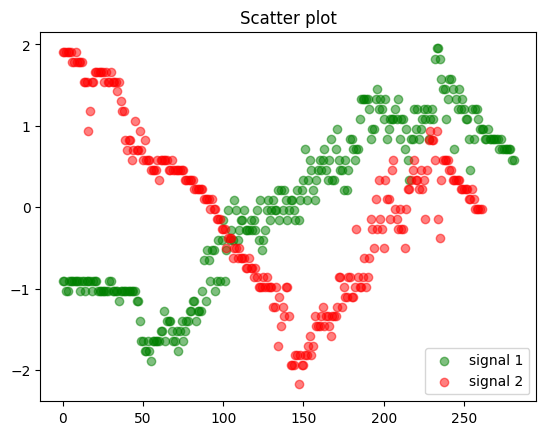

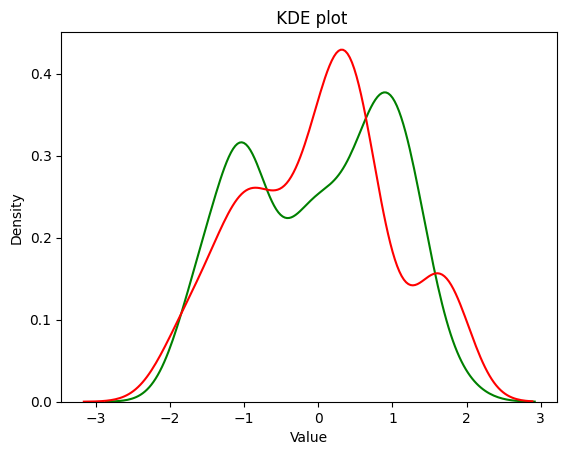

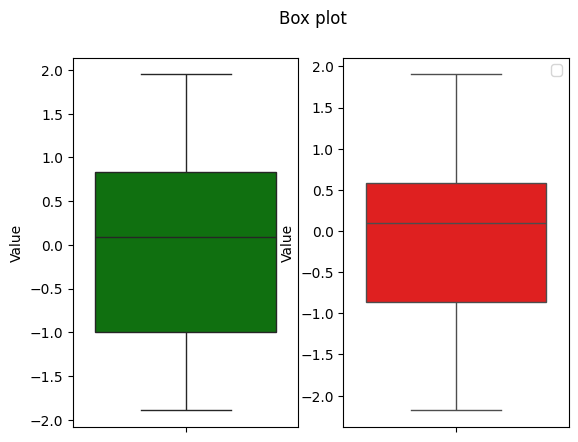

warning


,alpha,ks_test,anderson_test,cramervonmises_test,outliers_sig1,outliers_sig2,status
0,0.050,2.900003e-07,1.961,0.000082,"Series([], Name: Value, dtype: float64)","Series([], Name: Value, dtype: float64)",warning
1,0.010,2.900003e-07,3.752,0.000082,"Series([], Name: Value, dtype: float64)","Series([], Name: Value, dtype: float64)",warning
2,0.001,2.900003e-07,6.546,0.000082,"Series([], Name: Value, dtype: float64)","Series([], Name: Value, dtype: float64)",warning


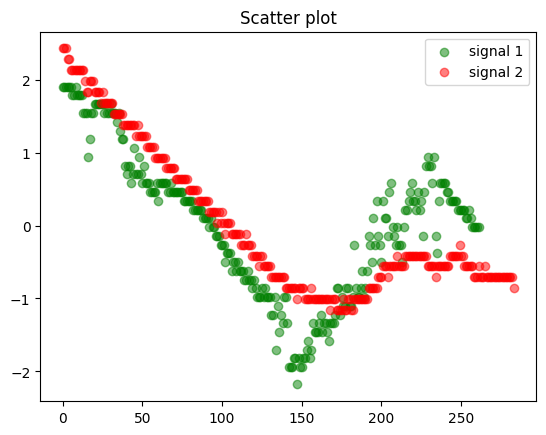

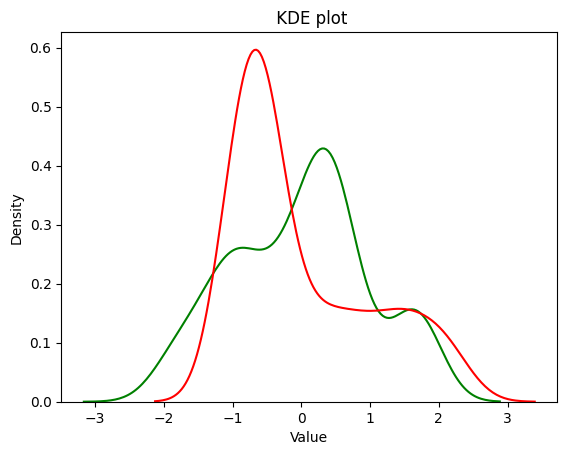

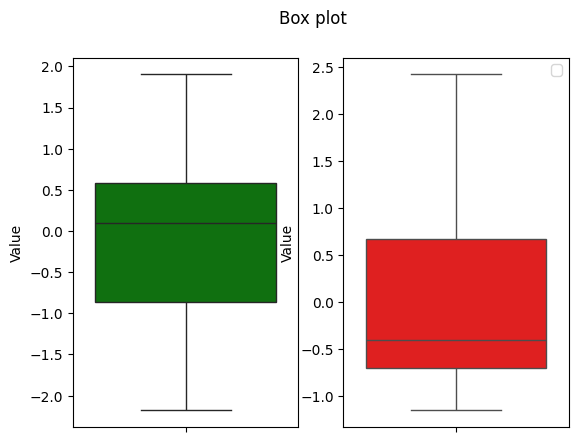

warning


,alpha,ks_test,anderson_test,cramervonmises_test,outliers_sig1,outliers_sig2,status
0,0.050,4.397764e-10,1.961,3.047146e-08,"Series([], Name: Value, dtype: float64)","Series([], Name: Value, dtype: float64)",warning
1,0.010,4.397764e-10,3.752,3.047146e-08,"Series([], Name: Value, dtype: float64)","Series([], Name: Value, dtype: float64)",warning
2,0.001,4.397764e-10,6.546,3.047146e-08,"Series([], Name: Value, dtype: float64)","Series([], Name: Value, dtype: float64)",warning


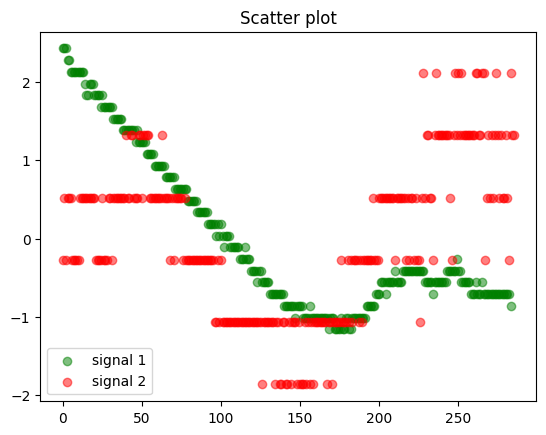

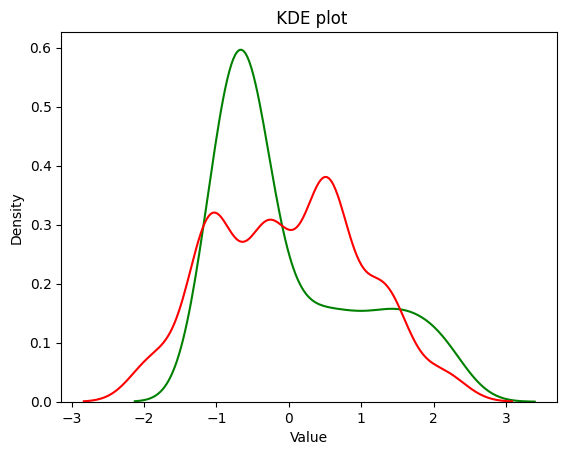

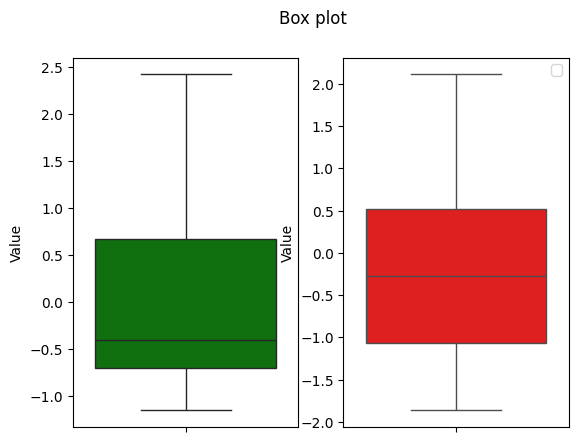

warning


,alpha,ks_test,anderson_test,cramervonmises_test,outliers_sig1,outliers_sig2,status
0,0.050,1.743628e-12,1.961,7.044030e-09,"Series([], Name: Value, dtype: float64)","Series([], Name: Value, dtype: float64)",warning
1,0.010,1.743628e-12,3.752,7.044030e-09,"Series([], Name: Value, dtype: float64)","Series([], Name: Value, dtype: float64)",warning
2,0.001,1.743628e-12,6.546,7.044030e-09,"Series([], Name: Value, dtype: float64)","Series([], Name: Value, dtype: float64)",warning


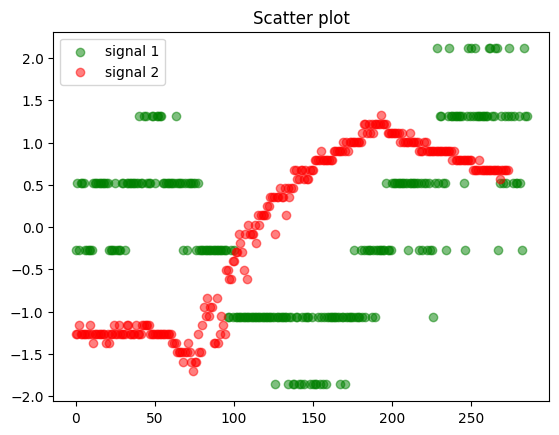

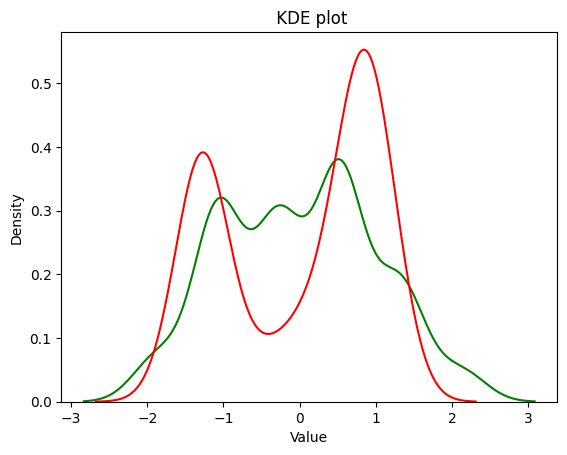

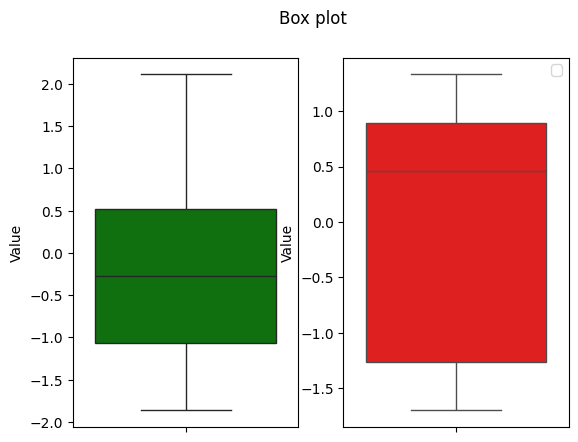

warning


,alpha,ks_test,anderson_test,cramervonmises_test,outliers_sig1,outliers_sig2,status
0,0.050,1.356460e-11,1.961,1.802822e-08,"Series([], Name: Value, dtype: float64)","Series([], Name: Value, dtype: float64)",warning
1,0.010,1.356460e-11,3.752,1.802822e-08,"Series([], Name: Value, dtype: float64)","Series([], Name: Value, dtype: float64)",warning
2,0.001,1.356460e-11,6.546,1.802822e-08,"Series([], Name: Value, dtype: float64)","Series([], Name: Value, dtype: float64)",warning


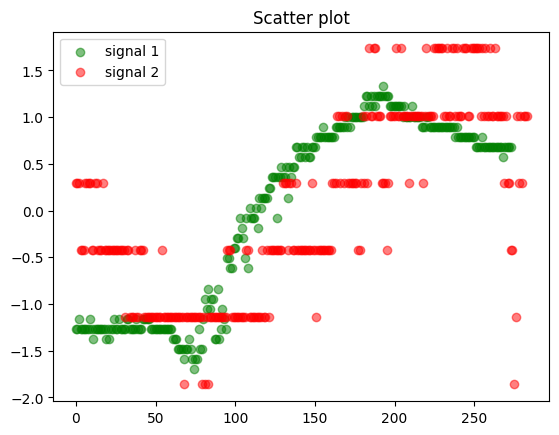

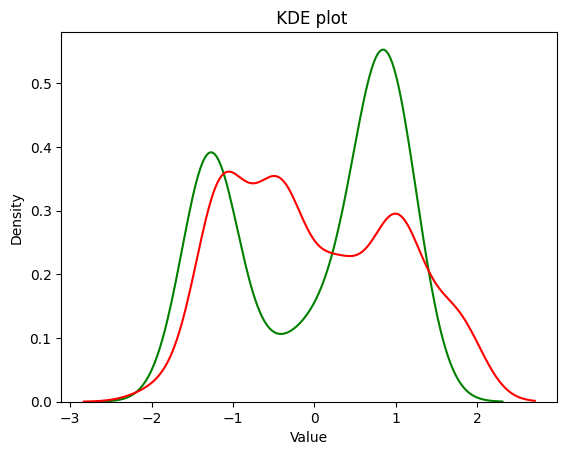

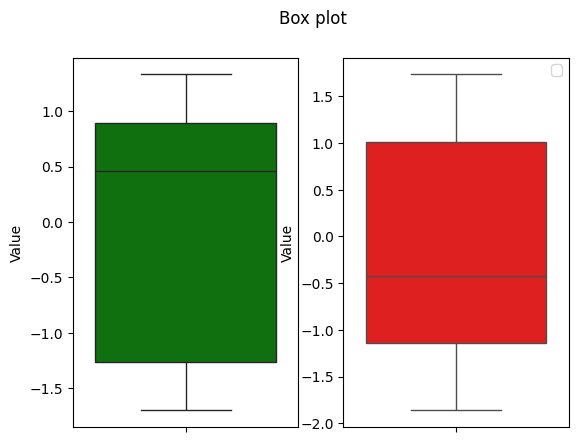

warning


,alpha,ks_test,anderson_test,cramervonmises_test,outliers_sig1,outliers_sig2,status
0,0.050,8.143853e-11,1.961,2.261105e-09,"Series([], Name: Value, dtype: float64)","Series([], Name: Value, dtype: float64)",warning
1,0.010,8.143853e-11,3.752,2.261105e-09,"Series([], Name: Value, dtype: float64)","Series([], Name: Value, dtype: float64)",warning
2,0.001,8.143853e-11,6.546,2.261105e-09,"Series([], Name: Value, dtype: float64)","Series([], Name: Value, dtype: float64)",warning


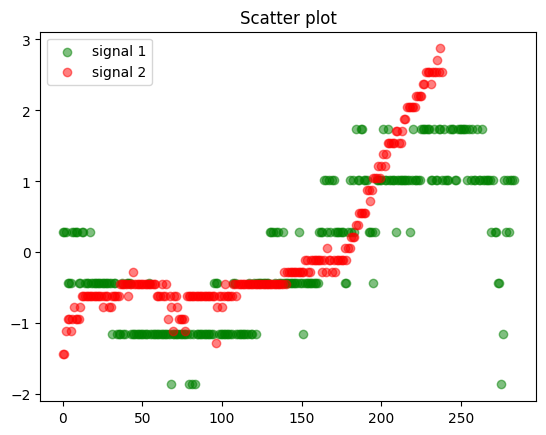

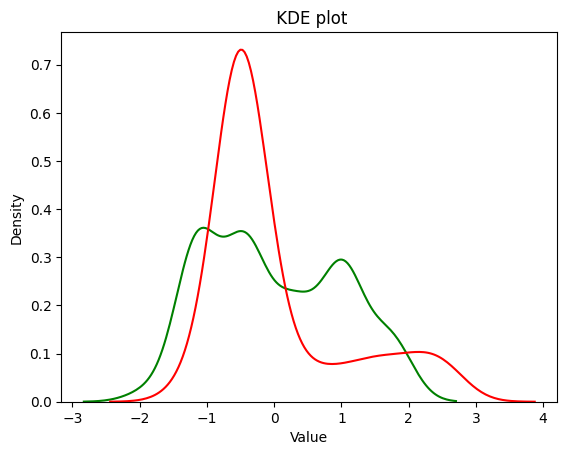

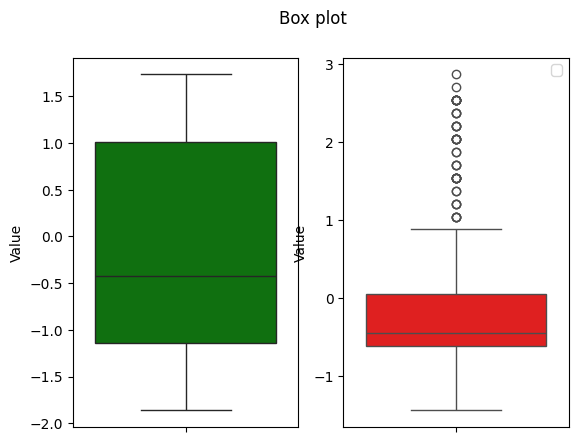

warning


,alpha,ks_test,anderson_test,cramervonmises_test,outliers_sig1,outliers_sig2,status
0,0.050,6.485263e-13,1.961,9.400033e-09,"Series([], Name: Value, dtype: float64)","Series([], Name: Value, dtype: float64)",warning
1,0.010,6.485263e-13,3.752,9.400033e-09,"Series([], Name: Value, dtype: float64)","Series([], Name: Value, dtype: float64)",warning
2,0.001,6.485263e-13,6.546,9.400033e-09,"Series([], Name: Value, dtype: float64)","Series([], Name: Value, dtype: float64)",warning


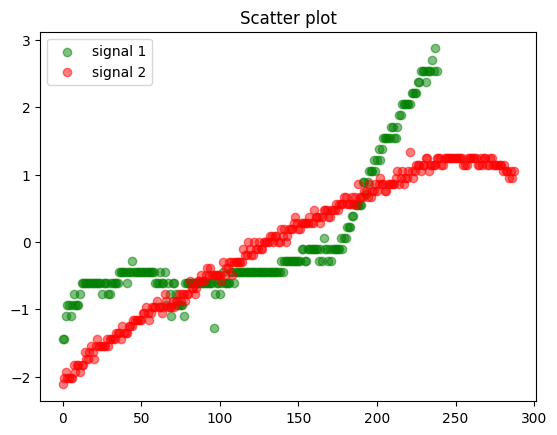

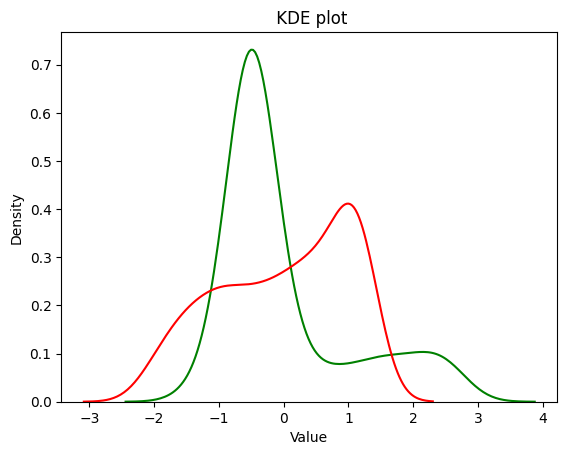

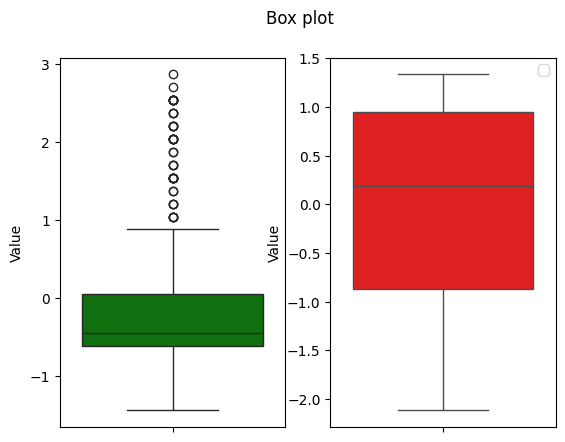

warning


,alpha,ks_test,anderson_test,cramervonmises_test,outliers_sig1,outliers_sig2,status
0,0.050,0.000518,1.961,0.001336,"Series([], Name: Value, dtype: float64)","Series([], Name: Value, dtype: float64)",warning
1,0.010,0.000518,3.752,0.001336,"Series([], Name: Value, dtype: float64)","Series([], Name: Value, dtype: float64)",warning
2,0.001,0.000518,6.546,0.001336,"Series([], Name: Value, dtype: float64)","Series([], Name: Value, dtype: float64)",warning


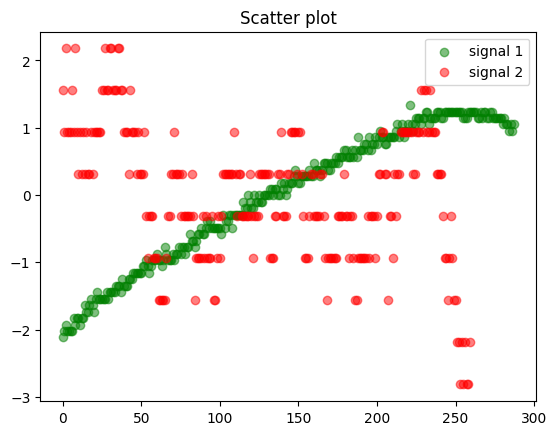

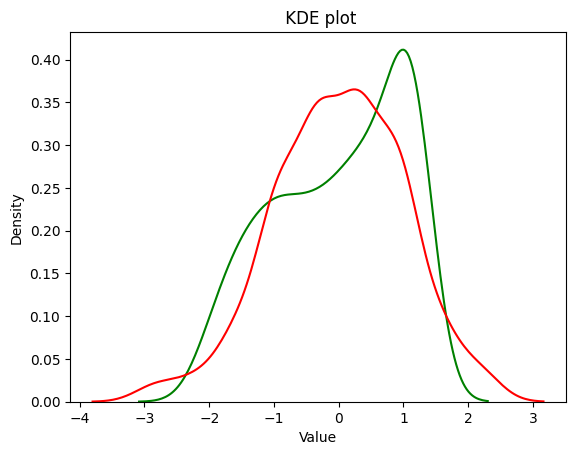

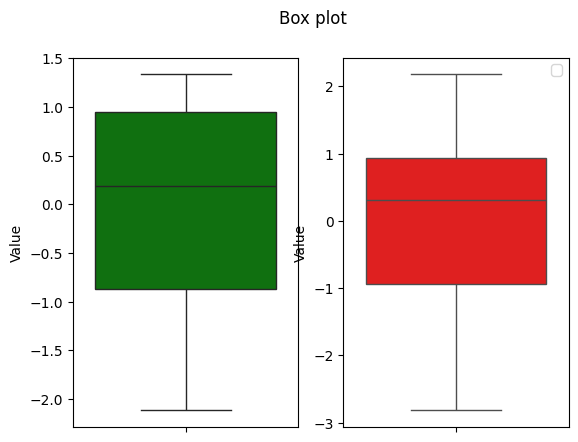

warning


,alpha,ks_test,anderson_test,cramervonmises_test,outliers_sig1,outliers_sig2,status
0,0.050,9.573605e-07,1.961,0.000101,"Series([], Name: Value, dtype: float64)","Series([], Name: Value, dtype: float64)",warning
1,0.010,9.573605e-07,3.752,0.000101,"Series([], Name: Value, dtype: float64)","Series([], Name: Value, dtype: float64)",warning
2,0.001,9.573605e-07,6.546,0.000101,"Series([], Name: Value, dtype: float64)","Series([], Name: Value, dtype: float64)",warning


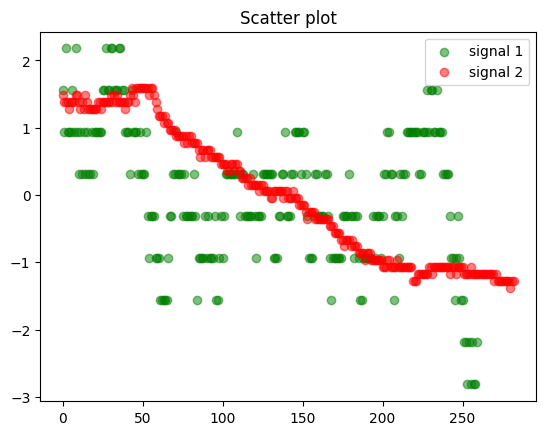

KeyboardInterrupt: 

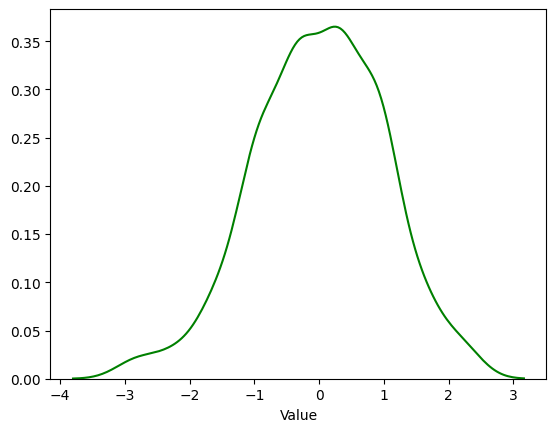

In [ ]:
cnt = [0, 0, 0]
checked = 0
p_values = [0.05, 0.01, 0.001]
for i in range(len(time_idx)-2):
    sig1 = df.Value[time_idx[i]:time_idx[i+1]]
    sig2 = df.Value[time_idx[i+1]:time_idx[i+2]]

    sig1 = (sig1 - sig1.mean()) / sig1.std()
    sig2 = (sig2 - sig2.mean()) / sig2.std()
    # sig1 = df[['Value', 'Timestamp']].iloc[time_idx[i]:time_idx[i+1]]
    # sig2 = df[['Value', 'Timestamp']].iloc[time_idx[i+1]:time_idx[i+2]]
    # sig1['hour'] = sig1.Timestamp.dt.hour
    # sig2['hour'] = sig2.Timestamp.dt.hour
    # sig1 = (sig1.Value - sig1.Value.mean()) / sig1.Value.std()
    # sig2 = (sig2.Value - sig2.Value.mean()) / sig2.Value.std()
    # sig1 = sig1.rename(columns=[])
    # sigs = pd.merge(sig1, sig2, on='hour', how='inner')

    if sig1.shape[0] < 60 or sig2.shape[0] < 60:
        continue
    checked += 1
    status_c = attacked_status(sig1, sig2).values[0]
    if status_c == 'warning':
        print(status_c)
        display(test_signals(sig1, sig2))
        visual_test_signals(sig1, sig2)


In [ ]:
cnt, checked

([206, 204, 203], 206)

In [ ]:
test_signals(sig1, sig1)

In [ ]:
cnt = 0
do = 0
for i in range(len(time_idx)-2):
    sig1 = df.Value[time_idx[i]:time_idx[i+1]]
    sig1 = (sig1 - sig1.mean()) / sig1.std()
    sig2 = df.Value[time_idx[i+1]:time_idx[i+2]]
    sig2 = (sig2 - sig2.mean()) / sig2.std()
    if sig1.shape[0] < 60 or sig2.shape[0] < 60:
        continue
    do += 1
    statues = attacked_status(sig1, sig2, a=0.001).values[0]
    if statues == 'warning':
        # print(statues)
        # display(test_signals(sig1, sig2))
        # visual_test_signals(sig1, sig2)

        cnt += 1
print(cnt, do)

112 206
